# 16-CH POLIMI-TCSPC Bursts Analysis

*This notebook uses [FRETBursts](http://tritemio.github.io/FRETBursts/) software
to analize single-molecule data from the 16-channel POLIMI TCSPC line-excitation setup.*

## Loading FRETBursts

In [1]:
from fretbursts import *

 - Optimized (cython) burst search loaded.
 - Optimized (cython) photon counting loaded.
--------------------------------------------------------------
 You are running FRETBursts (version 0.6+26.g2f59a03).

 If you use this software please cite the following paper:

   FRETBursts: An Open Source Toolkit for Analysis of Freely-Diffusing Single-Molecule FRET
   Ingargiola et al. (2016). http://dx.doi.org/10.1371/journal.pone.0160716 

--------------------------------------------------------------


In [2]:
%matplotlib inline

In [3]:
sns = init_notebook()

In [4]:
sns.set_style('ticks')

In [5]:
from pathlib import Path
import pandas as pd

In [6]:
import tcspc

In [7]:
def calc_offset_ns_mch(dx, idxmin, idxmax, rmin=0.1, rmax=0.9, cross_th=0.5, rebin=1, pdf=True, inbursts=False, subtract_min=True):
    offset_ns = np.zeros(16)
    for i in range(dx.nch):
        unit = dx.nanotimes_params[i]['tcspc_unit'] * 1e9
        ntimes = dx.nanotimes[i]
        if inbursts:
            ntimes = ntimes[dx.ph_in_bursts_mask_ich(i)]
        offset_ns[i] = tcspc.decay_hist_offset(ntimes, unit, idxmin=idxmin, idxmax=idxmax, rebin=rebin, pdf=pdf,
                                               rmin=rmin, rmax=rmax, cross_th=cross_th)
    if subtract_min:
        offset_ns -= offset_ns.min()
    return offset_ns

In [8]:
def linplot16(values, figsize=(6, 4), ax=None, title=None, kind='plot', **plt_kws):
    if ax is None:
        _, ax = plt.subplots(figsize=figsize)
    
    if kind == 'plot':
        plt_kws.setdefault('marker', 'o')
        plt_kws.setdefault('lw', 0)
        ax.plot(values, **plt_kws)
    elif kind == 'errorbar':
        ax.errorbar(x=np.arange(16), y=values, **plt_kws)
    else:
        left_bins = np.arange(16)
        ax.bar(left_bins, values, **plt_kws)
    ax.grid(True)
    ax.set_xticks(range(16))
    ax.set_xlabel('Spot')
    if title is not None:
        ax.set_title(title, va='bottom')
    return ax

In [9]:
savefigures = False

def savefig(fname, **kwargs):
    if not savefigures:
        return
    dir_ = 'figures/'
    kwargs.setdefault('dpi', 300)
    kwargs.setdefault('bbox_inches', 'tight')
    kwargs.setdefault('frameon', False)
    plt.savefig(dir_ + fname, **kwargs)

# Data Load


## 2015-09-08

In [10]:
dir = r'E:\Data\Antonio\data\POLIMI-TCSPC-16ch\2015-09-08'

In [11]:
fnlist = [f.name for f in Path(dir).glob('*.hdf5') if '_cache.' not in f.name]
fnlist

['2015-09-08_DA_12_D_8_MIX_LP-BP-100mW_6.hdf5',
 '2015-09-08_IRF-TE50-surface-BP-100mW_3.hdf5',
 '2015-09-08_IRF-TE50-surface-plus-BP-100mW_4.hdf5',
 '2015-09-08_TA-15-NT-3_LP-BP-100mW_5.hdf5',
 'DA_12_D_8_MIX_LP-BP-100mW_6.hdf5',
 'IRF-TE50-surface-BP-100mW_3.hdf5',
 'IRF-TE50-surface-plus-BP-100mW_4.hdf5',
 'T-NTD-3-66pM-60uL-100mW_2.hdf5',
 'TA-15-NT-3_LP-BP-100mW_5.hdf5']

In [12]:
filename = dir + '/DA_12_D_8_MIX_LP-BP-100mW_6.hdf5'

In [13]:
dir = r'E:\Data\Antonio\data\POLIMI-TCSPC-16ch\2015-09-08'

filename = dir + '/TA-15-NT-3_LP-BP-100mW_5.hdf5'

In [14]:
import os
if os.path.isfile(filename):
    print("Perfect, I found the file!")
else:
    print("Sorry, I can't find the file:\n%s" % filename)

Perfect, I found the file!


# IRF

In [15]:
from IPython.display import display

In [16]:
filename_irf = dir + '/IRF-TE50-surface-plus-BP-100mW_4.hdf5'

In [17]:
filename_irf = dir + '/IRF-TE50-surface-BP-100mW_3.hdf5'

In [18]:
d_irf = loader.photon_hdf5(filename_irf)
filename_irf

'E:\\Data\\Antonio\\data\\POLIMI-TCSPC-16ch\\2015-09-08/IRF-TE50-surface-BP-100mW_3.hdf5'

In [19]:
print(d_irf.description.decode())

In [20]:
d_irf.acquisition_duration

array(244.669243)

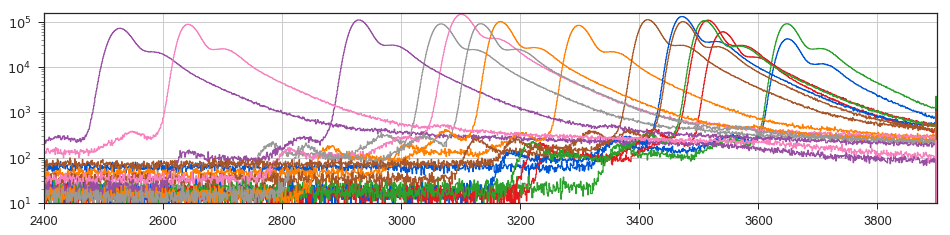

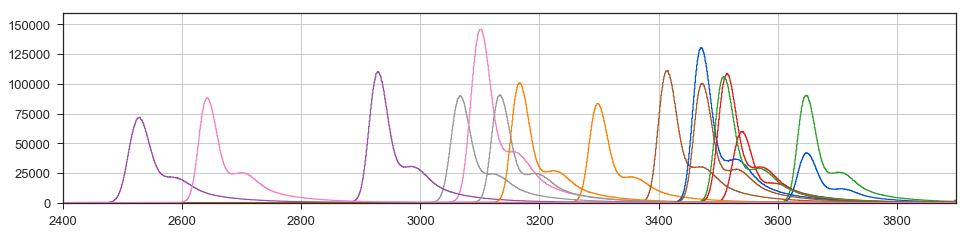

In [21]:
fig = plt.figure(figsize=(16, 3.5))
for nt in d_irf.nanotimes:
    plt.hist(nt, bins=np.arange(2400, 3900, 1), histtype='step', lw=1.2, normed=False);
plt.yscale('log')
plt.xlim(2400, 3900)
plt.grid()
#plt.ylim(2e-5, 1.5e-2)
plt.ylim(10, 160000)
display(fig)
plt.yscale('linear')
#plt.axhline(2e3)

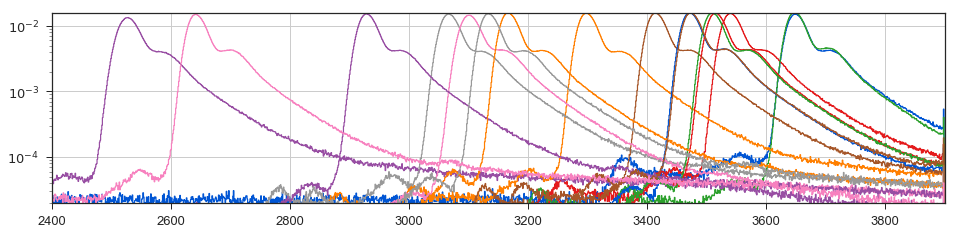

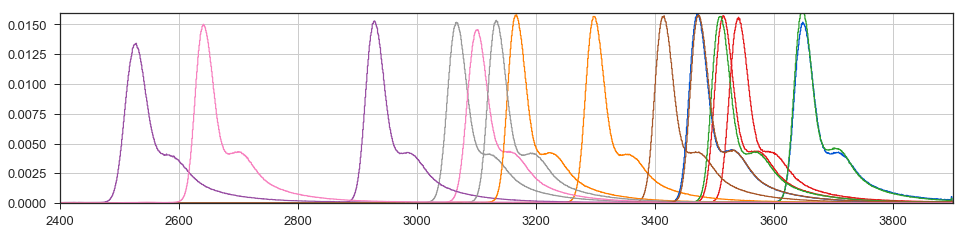

In [22]:
fig = plt.figure(figsize=(16, 3.5))
for nt in d_irf.nanotimes:
    plt.hist(nt, bins=np.arange(2400, 3900, 1), histtype='step', lw=1.2, normed=True);
plt.yscale('log')
plt.xlim(2400, 3900)
plt.grid()
plt.ylim(2e-5, 1.6e-2)
display(fig)
plt.yscale('linear')

In [23]:
offset_irf_ns0 = calc_offset_ns_mch(d_irf, idxmin=2400, idxmax=3900, rebin=1, subtract_min=False, cross_th=0.5)
offset_irf_ns0

array([ 12.10257397,  11.78441485,  12.3985312 ,   8.04843976,
        10.93700001,  10.12378782,  11.35808307,  10.17821318,
        11.58646017,  11.80683176,  11.49963389,   9.64369758,
        10.46320839,  10.07844819,  11.7379331 ,   8.69570671])

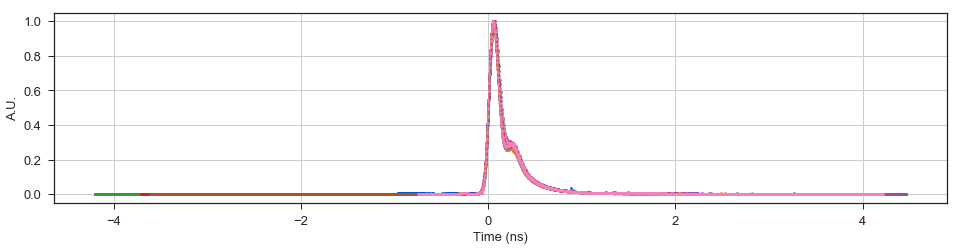

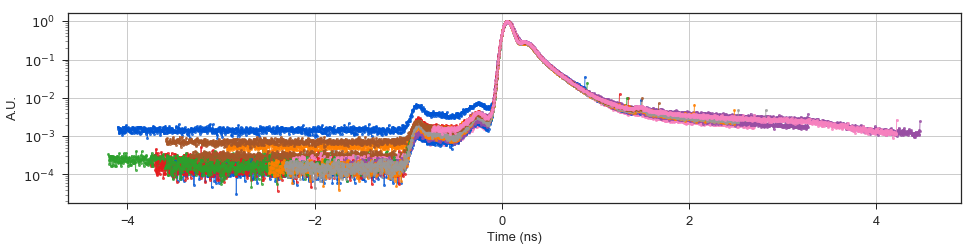

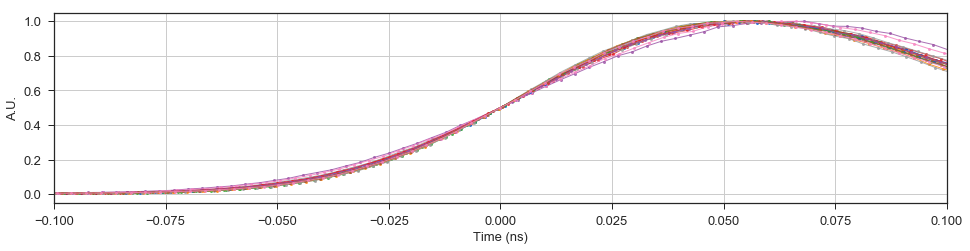

In [24]:
channels = range(16)
imin, imax = 2400, 3900

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=0.8)
for i in channels:
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    t, counts = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], unit, idxmin=imin, idxmax=imax, offset=offset_irf_ns0[i], pdf=True)
    plt.plot(t, counts/counts.max(), label='CH%d' % i, color='C%d' % (i % 8), **kws)
plt.xlabel('Time (ns)')
plt.ylabel('A.U.')
plt.grid(True)
display(fig)
plt.yscale('log')
display(fig)
plt.yscale('linear')
plt.xlim(-0.1, 0.1);

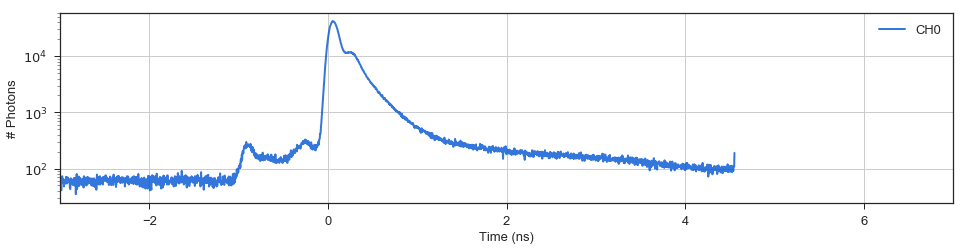

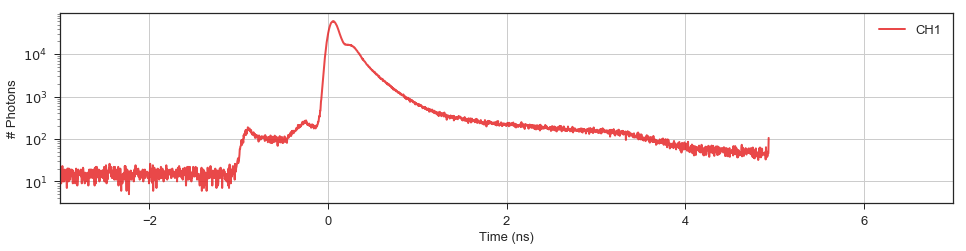

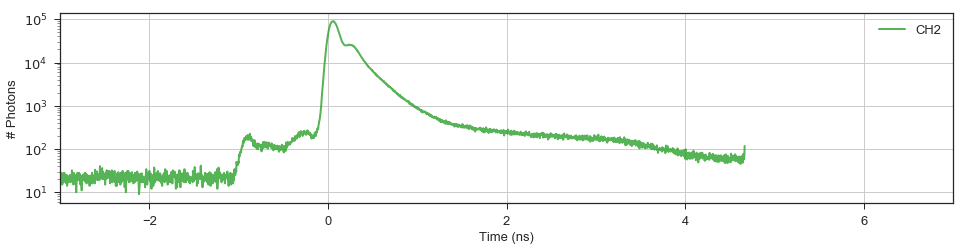

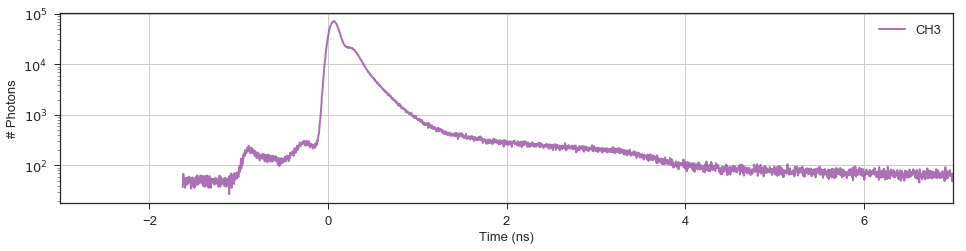

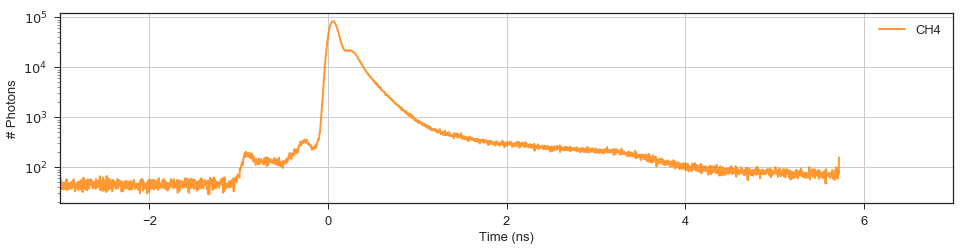

...

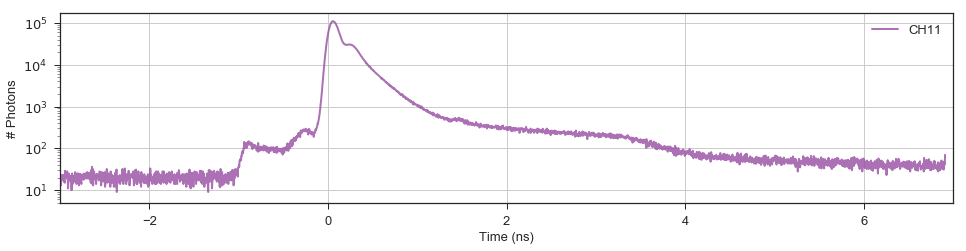

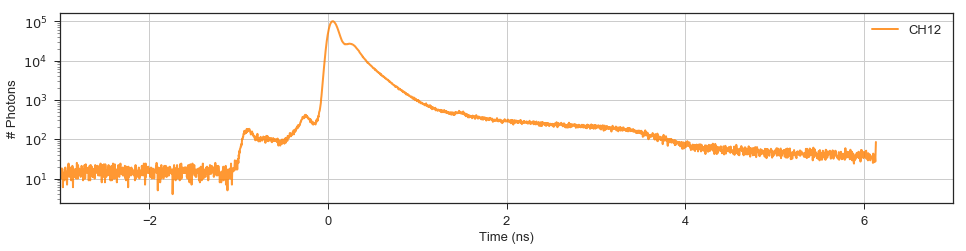

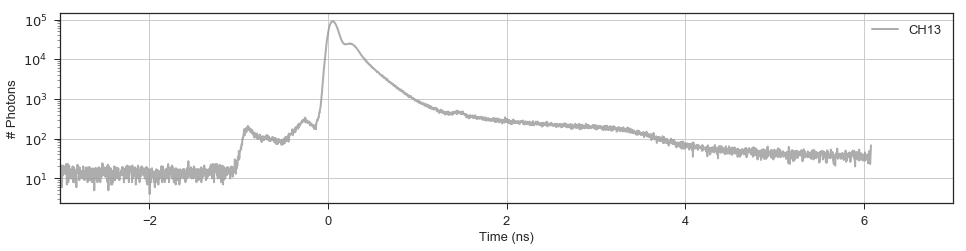

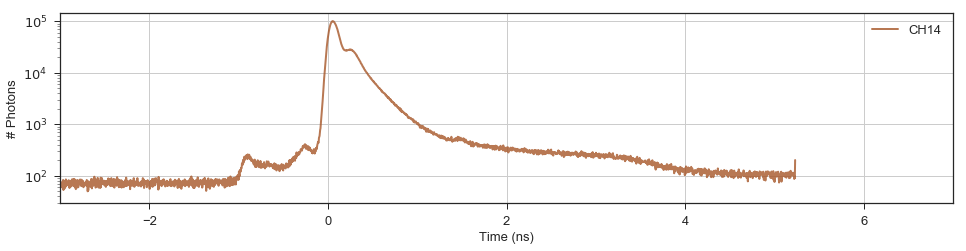

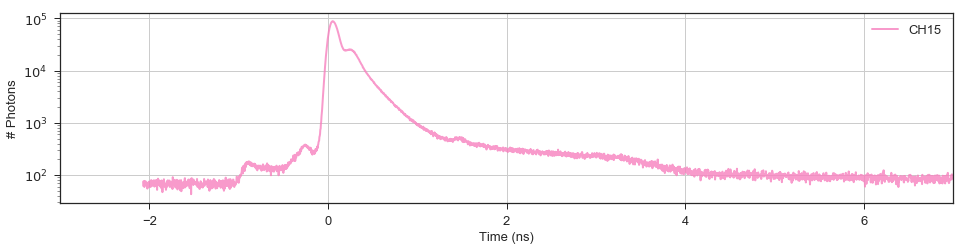

In [25]:
channels = range(16)
imin, imax = 2000, 5000

kws = dict(marker='o', ms=0, lw=2, alpha=0.8)
for i in channels:
    fig = plt.figure(figsize=(16, 3.5))
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    t, counts = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], unit, idxmin=imin, idxmax=imax, offset=offset_irf_ns0[i])
    plt.plot(t, counts, label='CH%d' % i, color='C%d' % (i % 8), **kws)
    plt.grid()
    plt.legend()
    plt.yscale('log')
    plt.xlabel('Time (ns)')
    plt.ylabel('# Photons')
    plt.xlim(-3, 7);

In [26]:
rebin = 2
irf_start, irf_stop = -0.5, 1.5
t1 = 1

irf_fwhm = np.zeros(16)
irf_fwhm_start = np.zeros(16)
irf_finalv = np.zeros(16)
for i in range(16):
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[i],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], **irf_kws)
    irf_unit = irf_pdf / irf_pdf.max()
    irf_halfmax = irf_unit.max() / 2
    
    irf_t1 = np.interp(irf_halfmax, xp=irf_unit[:irf_unit.argmax()], fp=x_irf[:irf_unit.argmax()])
    irf_fwhm_start[i] = irf_t1
    
    irf_idx2 = np.where(irf_unit[irf_unit.argmax():] < irf_halfmax)[0][0]
    xp = irf_unit[irf_unit.argmax():irf_unit.argmax()+irf_idx2+1][::-1]
    fp = x_irf[irf_unit.argmax():irf_unit.argmax()+irf_idx2+1][::-1]
    assert (np.diff(xp) >=0).all()
    irf_t2 = np.interp(irf_halfmax, xp=xp, fp=fp)
    irf_fwhm[i] = irf_t2 - irf_t1
    irf_finalv[i] = np.interp(t1, xp=x_irf, fp=irf_unit)

In [27]:
irf_finalv*100

array([ 1.30164209,  1.09992604,  0.95878103,  1.1598681 ,  1.00675863,
        0.98986252,  1.00223937,  0.92244117,  0.97337461,  1.00762901,
        1.00537721,  0.95955356,  0.96066661,  0.97862762,  1.03295391,
        1.0417189 ])

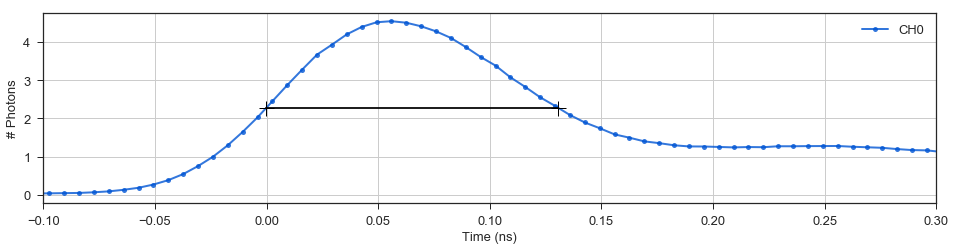

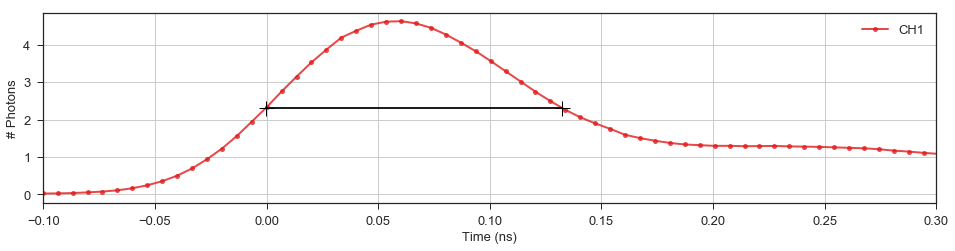

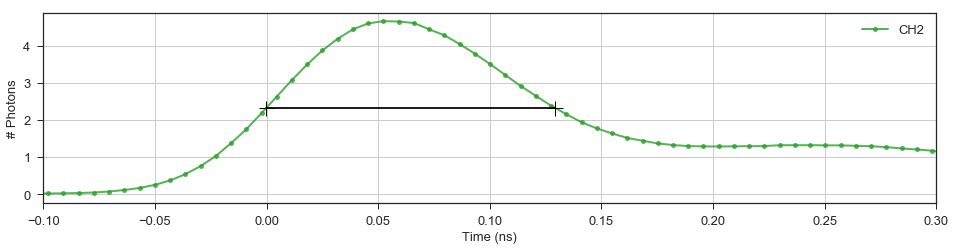

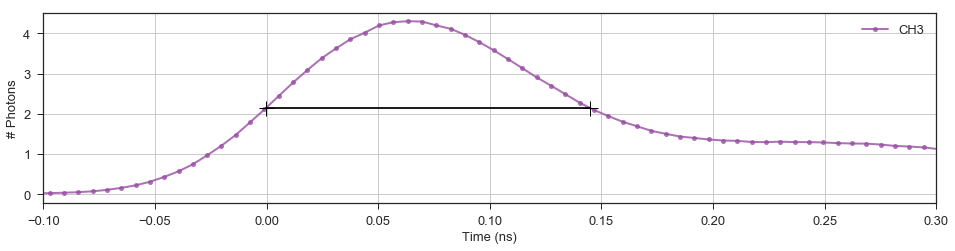

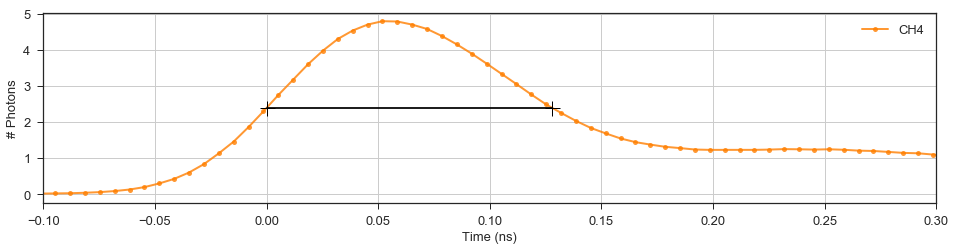

...

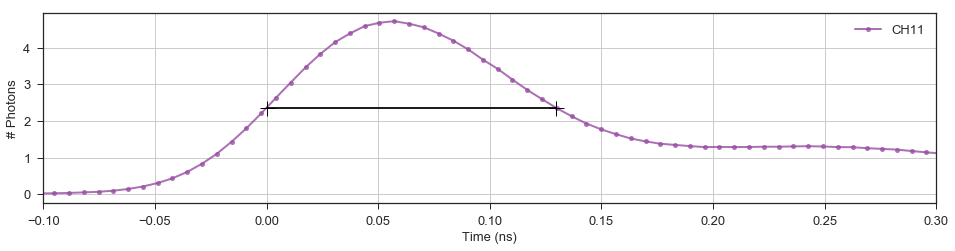

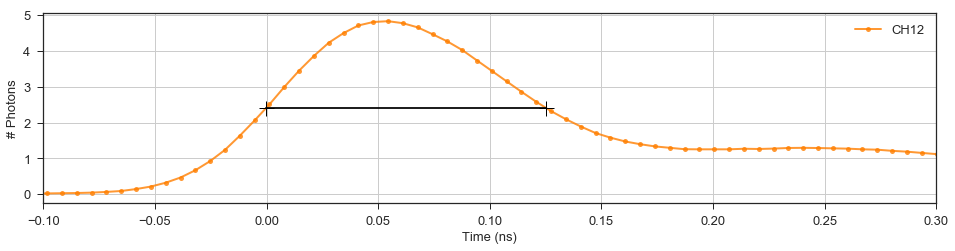

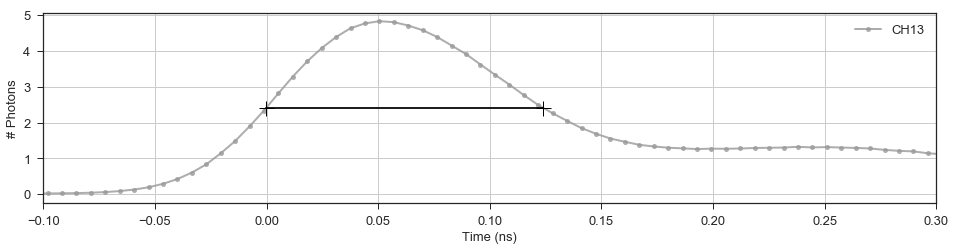

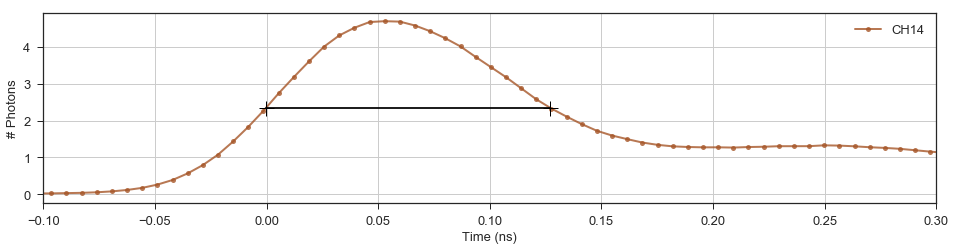

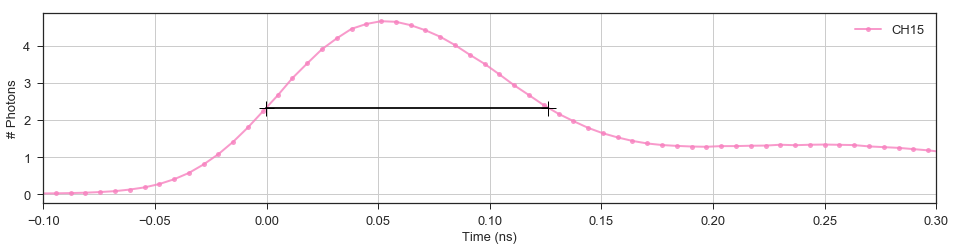

In [28]:
channels = range(16)
imin, imax = 2000, 5000

kws = dict(marker='o', ms=5, lw=2, alpha=0.8)
for i in channels:
    fig = plt.figure(figsize=(16, 3.5))
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[i],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], **irf_kws)
    plt.plot(x_irf, irf_pdf, label='CH%d' % i, color='C%d' % (i % 8), **kws)
    plt.grid()
    plt.legend()
    plt.xlabel('Time (ns)')
    plt.ylabel('# Photons')
    plt.xlim(-0.1, 0.3);
    plt.plot([irf_fwhm_start[i], irf_fwhm_start[i] + irf_fwhm[i]], [irf_pdf.max() / 2]*2, '-+k', mew=1, ms=15)

In [29]:
np.round(irf_fwhm, 4)

array([ 0.1309,  0.1325,  0.1292,  0.145 ,  0.1278,  0.1333,  0.129 ,
        0.139 ,  0.1268,  0.1302,  0.1265,  0.1297,  0.1251,  0.124 ,
        0.1273,  0.1264])

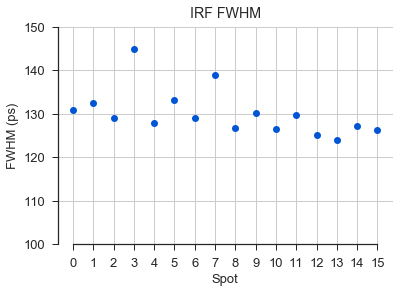

In [30]:
linplot16(irf_fwhm*1e3, title='IRF FWHM')
plt.ylabel('FWHM (ps)')
plt.ylim(100, 150)
sns.despine(trim=True)
savefig('irf_fwhm.png')

# Load the selected file

Here we load the file and we set the alternation parameters:

In [31]:
d = loader.photon_hdf5(filename)
filename

'E:\\Data\\Antonio\\data\\POLIMI-TCSPC-16ch\\2015-09-08/TA-15-NT-3_LP-BP-100mW_5.hdf5'

In [32]:
print(d.description.decode())

Medium FRET sample 20uL no gasket.

POLIMI-TCSPC module 16-CH [Pos1: 0403FE6A (ch 1-8), Pos3: 0403F16A (ch 9-16)]; Manta 0403DAE6.


In [33]:
d.acquisition_duration, d.time_min, d.time_max

(array(1225.9), 21.68127445, 1247.5927436499999)

In [34]:
d.acquisition_duration / 60

20.431666666666668

In [35]:
data16ch = pd.read_csv('data/DCR_2015-08-28.csv', index_col=0)
data16ch['Signal'] = ((d.ph_data_sizes / d.acquisition_duration) - data16ch.DCR).round(1)
data16ch

,DCR,Signal
CH,,
0,3019.8,3763.6
1,175.4,4077.5
2,546.0,4293.8
3,1903.9,4497.6
4,1864.4,4627.2
...,...,...
11,385.9,3885.0
12,124.7,3665.3
13,144.0,3437.5


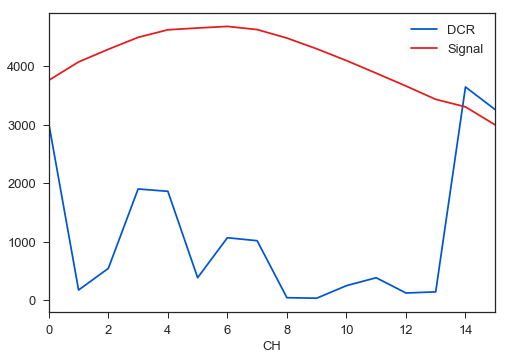

In [36]:
data16ch.plot()

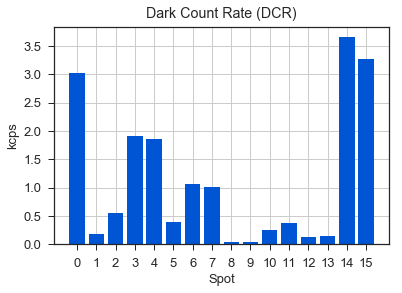

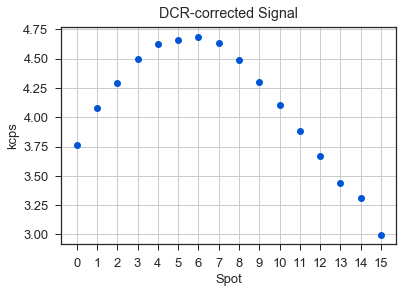

In [37]:
linplot16(data16ch.DCR*1e-3, kind='bar', title='Dark Count Rate (DCR)')
plt.ylabel('kcps')
savefig('DCR.png')
linplot16(data16ch.Signal*1e-3, title='DCR-corrected Signal')
plt.ylabel('kcps')
#plt.ylim(0, 13)
savefig('signal.png')

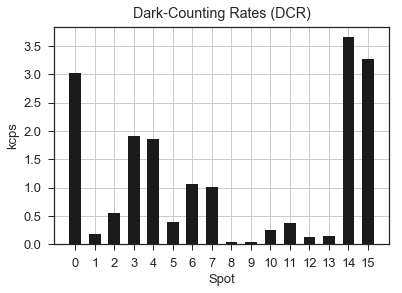

In [38]:
linplot16(data16ch.DCR*1e-3, kind='bar', color='.1', width=0.6, title='Dark-Counting Rates (DCR)')
plt.ylabel('kcps')
savefig('DCR_black.png')

In [39]:
d.A_em[0]

slice(None, None, None)

In [40]:
#%matplotlib notebook

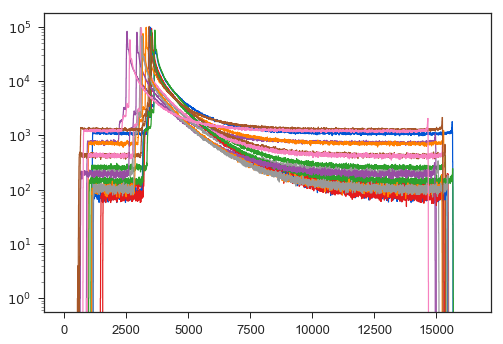

In [41]:
for nt in d.nanotimes:
    plt.hist(nt, bins=np.arange(0, 2**14, 4), histtype='step', lw=1.2);
plt.yscale('log')

# Background

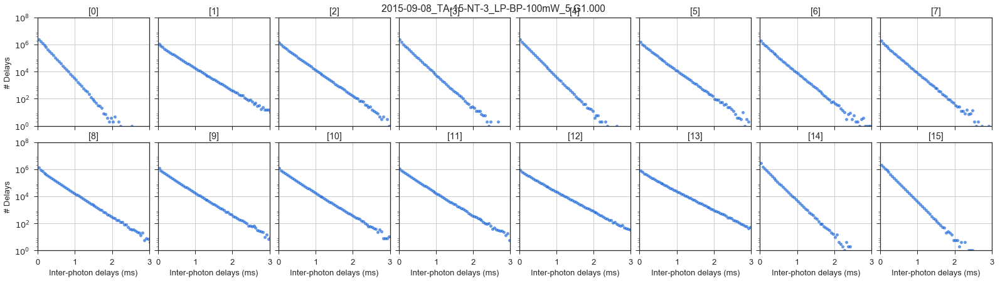

In [42]:
dplot(d, hist_interphoton_single, binwidth=50e-6, tmax=0.01)
plt.xlim(0, 3);
plt.ylim(1, 1e8);

In [43]:
d.calc_bg_cache(fun=bg.exp_fit, time_s=60, tail_min_us=300)

 * Loading BG rates from cache ... 
 - Loading bakground data:  [DONE]


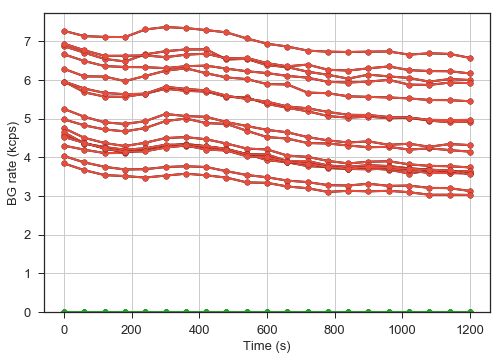

In [44]:
for ich in range(16):
    timetrace_bg(d, i=ich, nolegend=True)

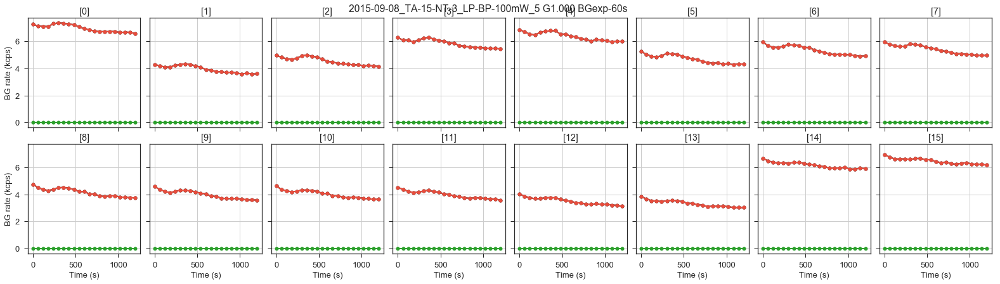

In [45]:
dplot(d, timetrace_bg);

In [46]:
#data16ch['RAW Background'] = [b[:3].mean() for b in d.bg[Ph_sel('all')]]
data16ch['RAW Background'] = d.bg_mean[Ph_sel('all')]

In [47]:
data16ch['Background'] = data16ch['RAW Background'] - data16ch['DCR']

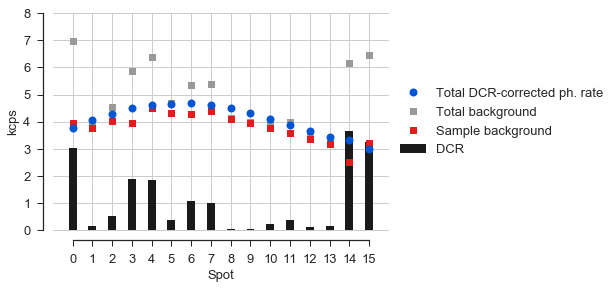

In [48]:
ax = linplot16(data16ch.Signal*1e-3, zorder=10, ms=8, label='Total DCR-corrected ph. rate')
linplot16(data16ch['RAW Background']*1e-3, marker='s', color='0.6', zorder=1, label='Total background', ax=ax)
linplot16(data16ch.Background*1e-3, marker='s', color='C1', label='Sample background', ax=ax)
linplot16(data16ch.DCR*1e-3, kind='bar', color='.1', width=0.4, label='DCR', ax=plt.gca())

plt.ylabel('kcps')
leg = plt.legend(bbox_to_anchor=(1, 0.5), loc='center left');
leg.get_frame().set(facecolor='w', alpha=1)
plt.ylim(0, 8)
sns.despine(trim=True, offset=10)
savefig('signal_vs_bg_vs_sbg_vs_dcr.png')

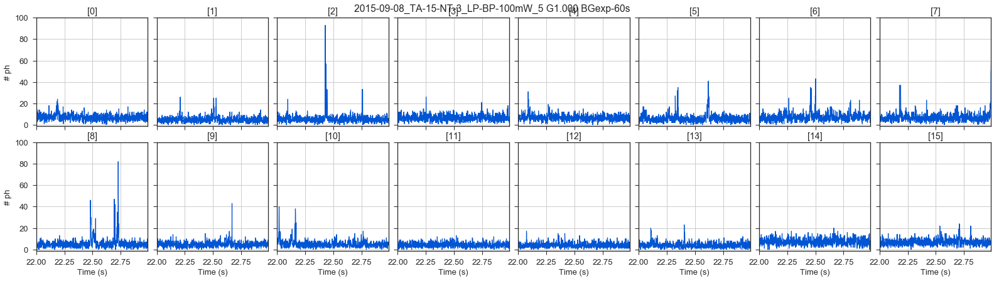

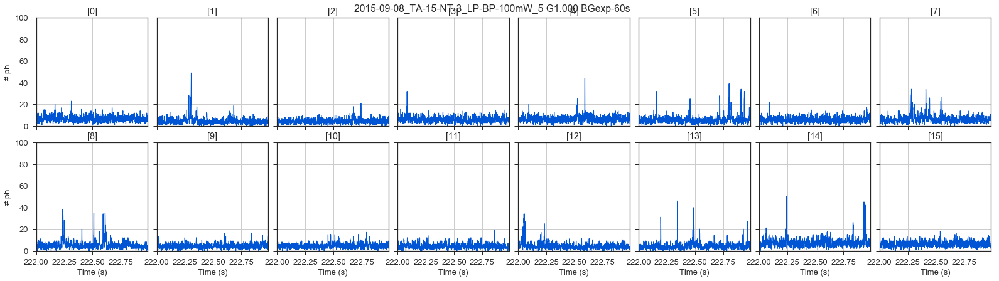

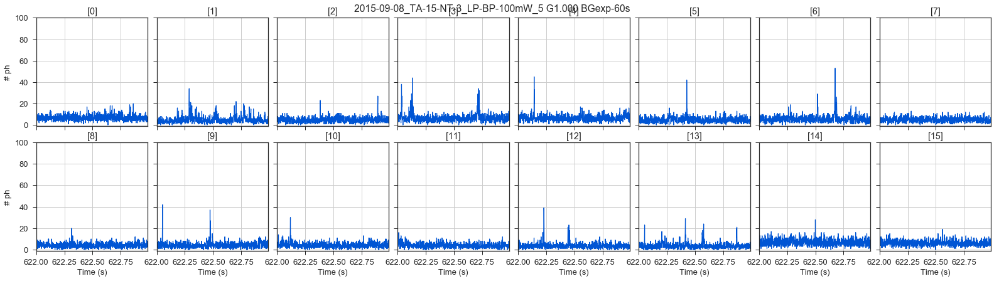

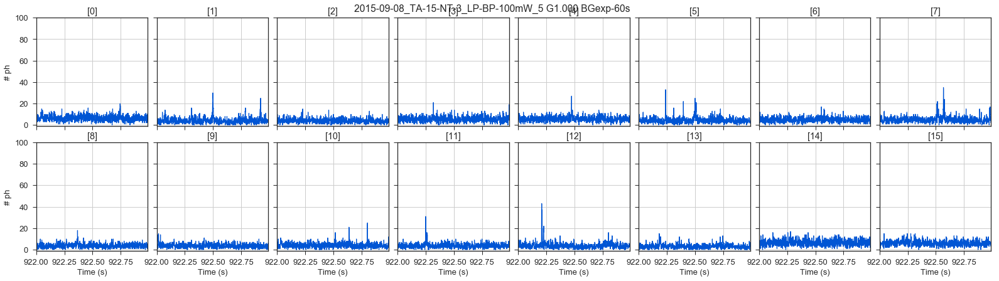

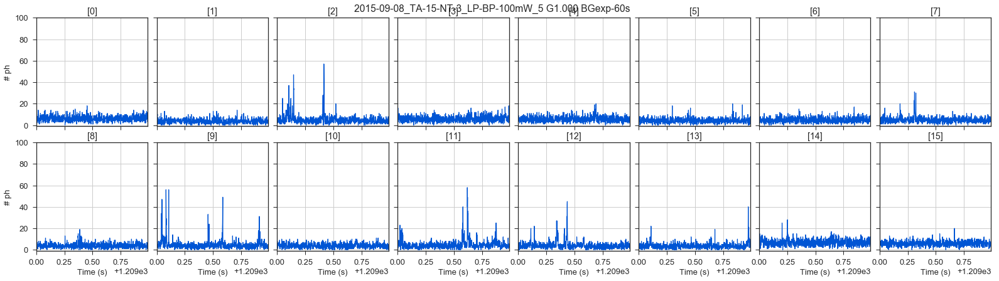

In [49]:
start = int(d.time_min) + 1
for i in (0, 200, 600, 900, 1187):
    dplot(d, timetrace_single, tmin=start+i, tmax=start+i+1, show_rate_th=False);
    plt.xlim(start+i, start+i+0.99)

# Burst search: constant rate

In [50]:
d.burst_search(min_rate_cps=70e3)

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   - Applying leakage correction.
   [DONE Counting D/A]


In [51]:
d.calc_max_rate(m=10)

## Burst sizes

In [52]:
th1 = 20

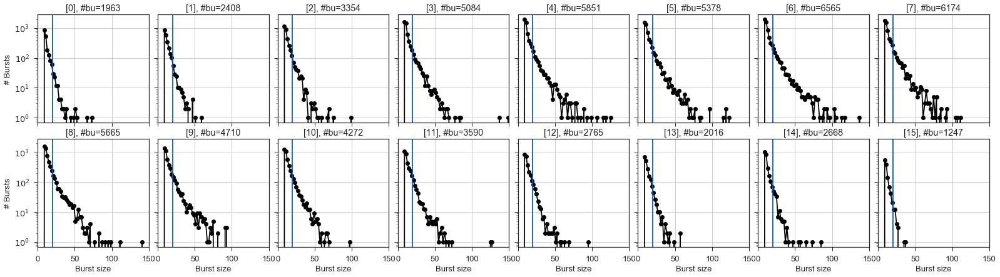

In [53]:
ax = dplot(d, hist_size, bins=(0, 300, 2), suptitle=False);
plt.xlim(0, 150)
savefig('burstsize.png')
for a in ax.ravel():
    a.axvline(th1)

In [54]:
ds = d.select_bursts(select_bursts.size, th1=th1)

mean_bs = np.array([nt.mean() - th1 for nt in ds.nt])

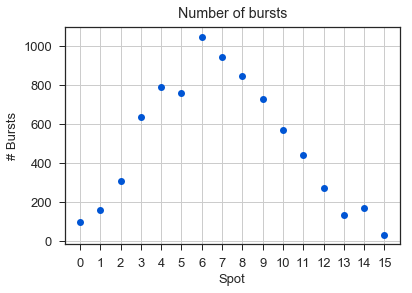

In [55]:
linplot16(ds.num_bursts, title='Number of bursts')
plt.ylabel('# Bursts');
savefig('numbursts_th%d.png' % th1)

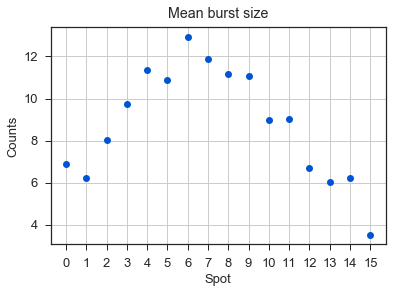

In [56]:
linplot16(mean_bs, title='Mean burst size')
plt.ylabel('Counts');
savefig('meaburstsize_th%d.png' % th1)

## Burst durations

In [57]:
bw_th = 0.25

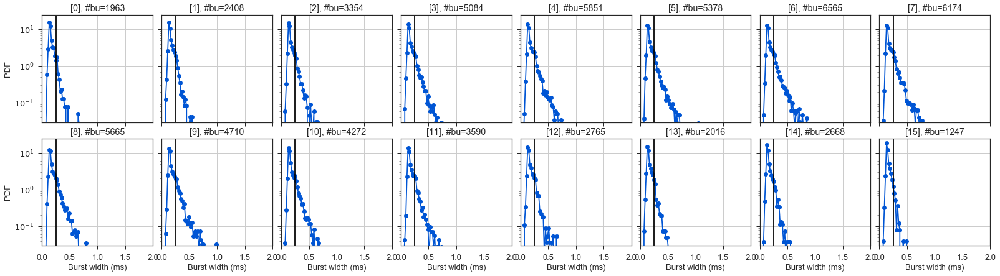

In [58]:
ax = dplot(d, hist_width, bins=(0, 5, 0.02), suptitle=False);
plt.xlim(0, 2)
savefig('burstwidth.png')
for a in ax.ravel():
    a.axvline(bw_th, color='k')

In [59]:
d.mburst[0].width[:10]

array([6297, 2683, 2820, 2896, 3176, 2324, 2701, 2458, 2710, 2960], dtype=int64)

In [60]:
bw_th_clk = bw_th * 1e-3 / d.clk_p
mean_bw = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_th 
           for bursts in ds.mburst]
mean_bw = np.array(mean_bw)
mean_bw[:3]

array([ 0.09652258,  0.08548287,  0.10569487])

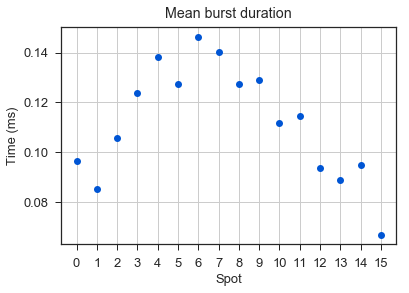

In [61]:
linplot16(mean_bw, title='Mean burst duration')
plt.ylabel('Time (ms)');
savefig('meaburstwidth_th%.1fms.png' % bw_th)

## Burst peak ph. rates

In [62]:
mr_th = 80e3

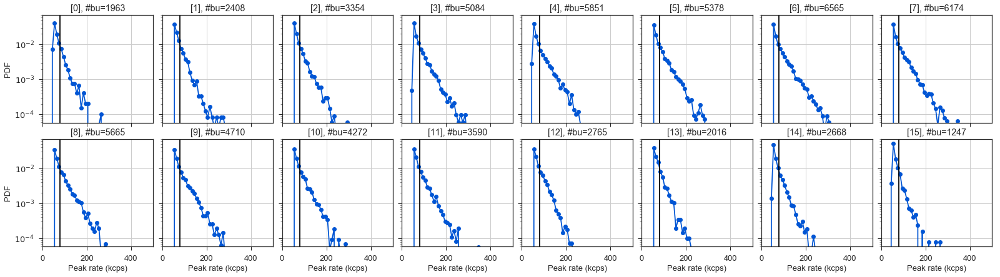

In [63]:
ax = dplot(d, hist_burst_phrate, bins=(0, 600, 10), suptitle=False);
plt.xlim(0, 500)
savefig('peak_ph_rate.png')
for a in ax.ravel():
    a.axvline(mr_th*1e-3, color='k')

In [64]:
d.max_rate[0][:10]

array([ 78201.70603222,  52366.35779657,  49469.20921461,  68596.95958537,
        88368.20155436,  61578.4363969 ,  59232.03618973,  57825.1925719 ,
        51772.21096804,  86628.33417716])

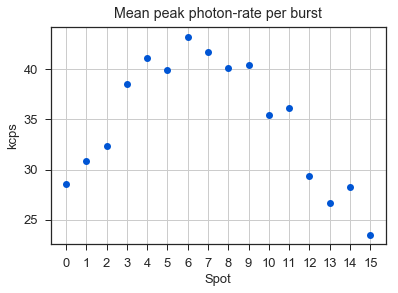

In [65]:
mmr = np.array([1e-3*(mr[mr > mr_th].mean() - mr_th) for mr in d.max_rate])

linplot16(mmr, title='Mean peak photon-rate per burst')
plt.ylabel('kcps');
savefig('mean_peak_ph_rate.png')

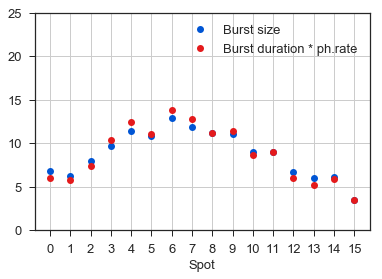

In [66]:
sim_mean_bs = (mean_bw * mmr) * mean_bs.mean() / (mean_bw * mmr).mean()
linplot16(mean_bs, label='Burst size')
linplot16(sim_mean_bs, label='Burst duration * ph.rate', ax=plt.gca())
plt.legend()
plt.ylim(0, 25);

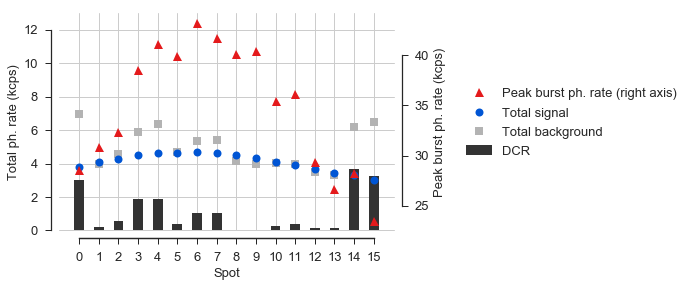

In [67]:
ax = linplot16(data16ch.Signal*1e-3, zorder=10, ms=8, label='Total signal')
linplot16(data16ch['RAW Background']*1e-3, marker='s', color='0.7', label='Total background', zorder=1, ms=8, ax=ax)
linplot16(data16ch.DCR*1e-3, kind='bar', color='.2', width=0.5, label='DCR', ax=ax)
plt.ylabel('Total ph. rate (kcps)')
ax.set_ylim(0, 13)
ax2 = plt.twinx()
linplot16(mmr, label='Peak burst ph. rate (right axis)', ax=ax2, color='C1', marker='^', ms=9)
ax2.set_ylabel('Peak burst ph. rate (kcps)')
ax2.grid(False)

leg2 = ax2.legend(bbox_to_anchor=(1.18, 0.63), loc='center left');
leg = ax.legend(bbox_to_anchor=(1.18, 0.45), loc='center left');
#savefig('signal_vs_raw_background_vs_dcr.png')
#leg = plt.legend(bbox_to_anchor=(0.5, 0.4), loc='center', frameon=True);
#leg.get_frame().set(facecolor='w', alpha=1)
sns.despine(ax=ax, trim=True, offset=8)
sns.despine(ax=ax2, left=True, right=False, trim=True, offset=8)
savefig('signal_vs_raw_background_vs_dcr_vs_peak_ph_rate.png')

> This show the comparison between the signal profile and the peak burst photon rate profile.

# Burst search: PSF FWHM threshold

In [68]:
dw = d.copy()

Deep copy executed.


In [69]:
mmr

array([ 28.57748513,  30.8105156 ,  32.31028495,  38.48243169,
        41.16659715,  39.90530356,  43.22923263,  41.75205609,
        40.16799803,  40.41763492,  35.48415649,  36.16415813,
        29.3188747 ,  26.67435828,  28.26992726,  23.52194988])

In [70]:
dw.burst_search(min_rate_cps=mmr*1.2e3)

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   - Applying leakage correction.
   [DONE Counting D/A]


In [71]:
dw.calc_max_rate(m=10)

In [72]:
dw.rate_th

array([ 34292.9821591 ,  36972.61872005,  38772.34194595,  46178.91802356,
        49399.91657833,  47886.36427686,  51875.07915472,  50102.46731007,
        48201.59763146,  48501.16190387,  42580.98779152,  43396.98975258,
        35182.64963804,  32009.22994147,  33923.9127079 ,  28226.33985481])

## Burst sizes

In [73]:
th1w = 20

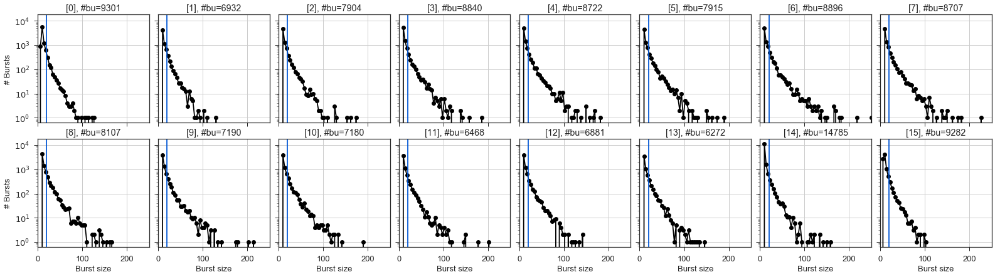

In [74]:
ax = dplot(dw, hist_size, suptitle=False);
plt.xlim(0, 250)
for a in ax.ravel():
    a.axvline(th1w)

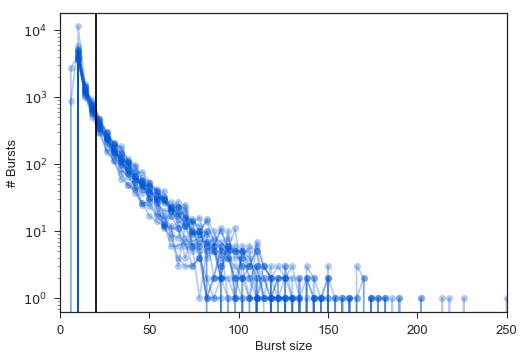

In [75]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_size(dw, i=ich, color='C0', plot_style=plt_kws, legend=False, pdf=False)
plt.xlim(0, 250)
plt.axvline(th1w, color='k')

In [76]:
dsw = dw.select_bursts(select_bursts.size, th1=th1w)

mean_bsw = np.array([nt.mean() - th1w for nt in dsw.nt])

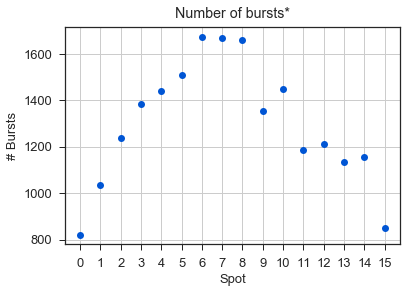

In [77]:
linplot16(dsw.num_bursts, title='Number of bursts*')
plt.ylabel('# Bursts');
savefig('numbursts_bs_peak_ph_rate_th%d.png' % th1w)

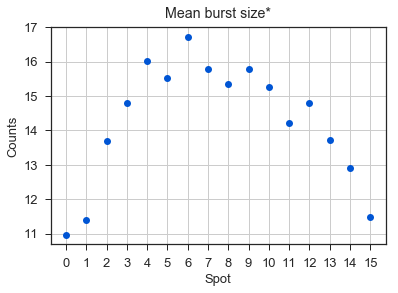

In [78]:
linplot16(mean_bsw, title='Mean burst size*')
plt.ylabel('Counts');
savefig('meaburstsize_bs_peak_ph_rate_th%d.png' % th1w)

In [79]:
sns.set_style('ticks')

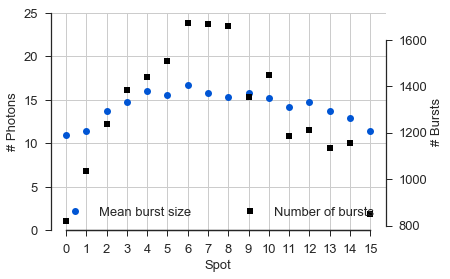

In [80]:
ax = linplot16(mean_bsw, label='Mean burst size')
ax.set(ylabel='# Photons', ylim=(0, 25))
ax2 = plt.twinx(ax)
linplot16(dsw.num_bursts, ax=ax2, marker='s', ms=6, color='k', label='Number of bursts')
ax2.grid(False)
ax2.set_ylabel('# Bursts');
#ax2.set_ylim(0, 6950)
ax2.legend(loc='lower right')
ax.legend(loc='lower left')
sns.despine(ax=ax, right=True, left=False, trim=True)
sns.despine(ax=ax2, right=False, left=True, trim=True)
#savefig('meaburstsize_bs_peak_ph_rate_th%d_numbursts.png' % th1w)

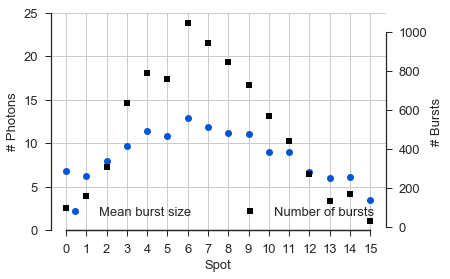

In [81]:
ax = linplot16(mean_bs, label='Mean burst size')
ax.set(ylabel='# Photons', ylim=(0, 25))
ax2 = plt.twinx(ax)
linplot16(ds.num_bursts, ax=ax2, marker='s', ms=6, color='k', label='Number of bursts')
ax2.grid(False)
ax2.set_ylabel('# Bursts');
#ax2.set_ylim(0, 6950)
ax2.legend(loc='lower right')
ax.legend(loc='lower left')
sns.despine(ax=ax, right=True, left=False, trim=True)
sns.despine(ax=ax2, right=False, left=True, trim=True)
#savefig('meaburstsize_bs_peak_ph_rate_th%d_numbursts.png' % th1w)

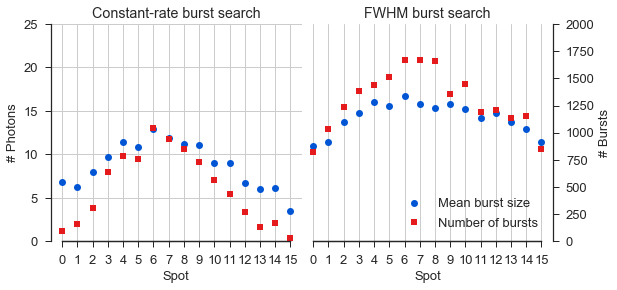

In [82]:
fig, ax = plt.subplots(1, 2, figsize=(9, 4), sharey=True)
linplot16(mean_bs, label='Mean burst size', ax=ax[0], color='C0')
ax[0].set(ylabel='# Photons', ylim=(0, 25))
ax02 = plt.twinx(ax[0])
linplot16(ds.num_bursts, ax=ax02, marker='s', ms=6, color='C1', label='Number of bursts')
ax02.grid(False)
ax02.set(ylabel='# Bursts', ylim=(0, 2000))
#ax02.legend(loc='lower right')
#ax[0].legend(loc='lower left')
sns.despine(ax=ax[0], right=True, left=False, trim=True)
sns.despine(ax=ax02, right=False, left=True, trim=True)

linplot16(mean_bsw, label='Mean burst size', ax=ax[1], color='C0')
ax[1].set(ylabel='# Photons', ylim=(0, 25))
ax12 = plt.twinx(ax[1])
linplot16(dsw.num_bursts, ax=ax12, marker='s', ms=6, color='C1', label='Number of bursts')
ax12.grid(False)
ax12.set(ylabel='# Bursts', ylim=(0, 2000))
ax12.legend(loc='lower left', bbox_to_anchor=(0.35, 0))
ax[1].legend(loc='lower left', bbox_to_anchor=(0.35, 0.09))
sns.despine(ax=ax[1], right=True, left=False, trim=True)
sns.despine(ax=ax12, right=False, left=True, trim=True)

ax02.yaxis.set_visible(False)
ax02.spines['right'].set_visible(False)
ax[1].yaxis.set_visible(False)
ax[1].spines['left'].set_visible(False)
plt.subplots_adjust(wspace=0.0)
ax[0].set_title('Constant-rate burst search')
ax[1].set_title('FWHM burst search')
savefig('meaburstsize_numbursts_bs_comp.png')

In [83]:
# sns.set_style('darkgrid')

## Burst durations

In [84]:
bw_thw = 0.7

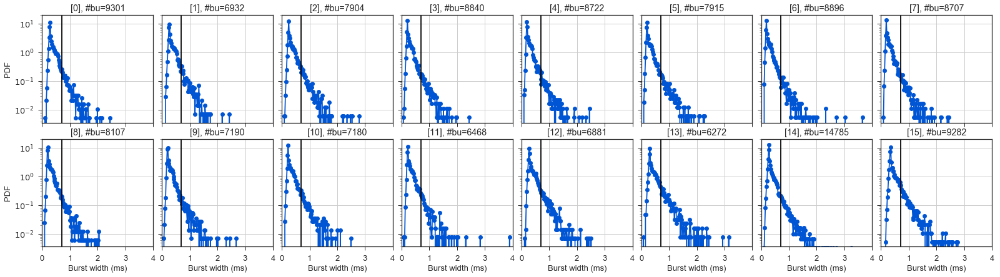

In [85]:
ax = dplot(dw, hist_width, bins=(0, 5, 0.02), suptitle=False);
plt.xlim(0, 4)
for a in ax.ravel():
    a.axvline(bw_thw, color='k')

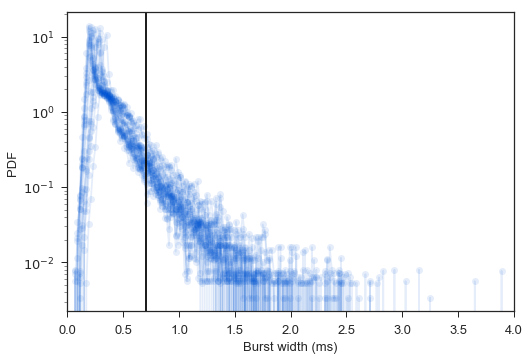

In [86]:
plt_kws = dict(alpha=0.1)
for ich in range(16):
    hist_width(dw, i=ich, color='C0', bins=(0, 5, 0.02), plot_style=plt_kws)
plt.xlim(0, 4)
plt.axvline(bw_thw, color='k')

(0, 0.6)

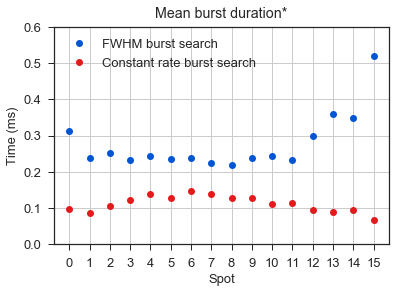

In [87]:
bw_thw = 0.5
bw_th_clk = bw_thw * 1e-3 / d.clk_p
mean_bww = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_thw 
            for bursts in dsw.mburst]
mean_bww = np.array(mean_bww)

linplot16(mean_bww, label='FWHM burst search', title='Mean burst duration*')
linplot16(mean_bw, label='Constant rate burst search', ax=plt.gca())
plt.ylabel('Time (ms)');
plt.legend()
plt.ylim(0,0.6)
#savefig('meaburstwidth_bs_peak_ph_rate_th%.1fms.png' % bw_thw)

(0, 0.7)

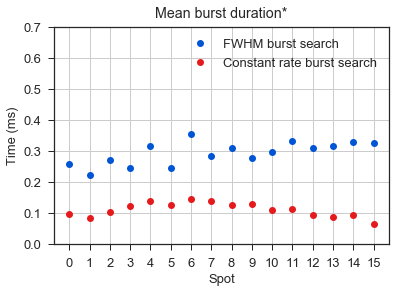

In [88]:
bw_thw = 1
bw_th_clk = bw_thw * 1e-3 / d.clk_p
mean_bww = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_thw 
            for bursts in dsw.mburst]
mean_bww = np.array(mean_bww)

linplot16(mean_bww, label='FWHM burst search', title='Mean burst duration*')
linplot16(mean_bw, label='Constant rate burst search', ax=plt.gca())
plt.ylabel('Time (ms)');
plt.legend()
plt.ylim(0,0.7)
#savefig('meaburstwidth_bs_peak_ph_rate_th%.1fms.png' % bw_thw)

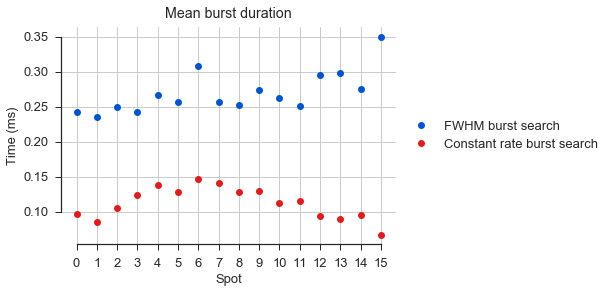

In [89]:
bw_thw = 0.7
bw_th_clk = bw_thw * 1e-3 / d.clk_p
mean_bww = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_thw 
            for bursts in dsw.mburst]
mean_bww = np.array(mean_bww)

linplot16(mean_bww, label='FWHM burst search', title='Mean burst duration')
linplot16(mean_bw, label='Constant rate burst search', ax=plt.gca())
plt.ylabel('Time (ms)');
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
#plt.ylim(0,2)
sns.despine(trim=True)
savefig('meaburstwidth_bs_comp.png')

## Burst peak ph. rates

In [90]:
mr_thw = 100e3

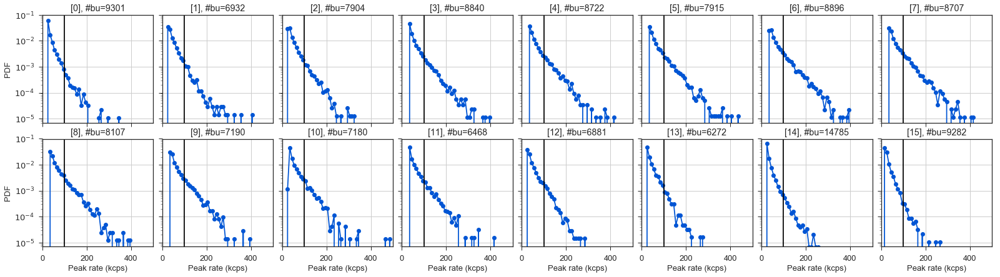

In [91]:
ax = dplot(dw, hist_burst_phrate, bins=(0, 800, 10), suptitle=False);
plt.xlim(0, 500)
#savefig('peak_ph_rate.png')
for a in ax.ravel():
    a.axvline(mr_thw*1e-3, color='k')

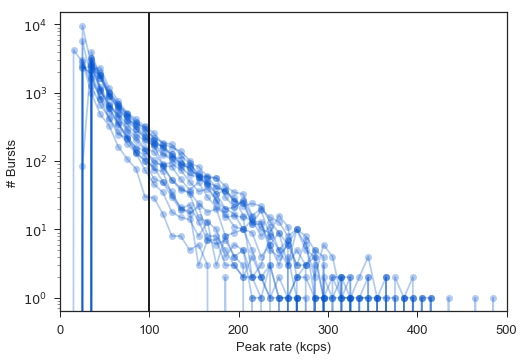

In [92]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_burst_phrate(dw, i=ich, color='C0', bins=(0, 600, 10), plot_style=plt_kws, pdf=False)
plt.xlim(0, 500)
plt.axvline(mr_thw*1e-3, color='k')

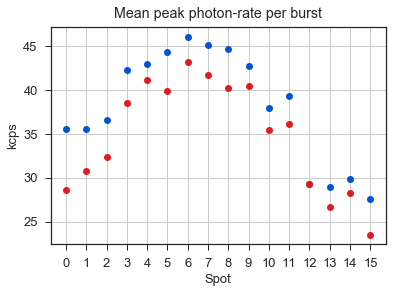

In [93]:
mmrw = np.array([1e-3*(mr[mr > mr_thw].mean() - mr_thw) for mr in dw.max_rate])

linplot16(mmrw, title='Mean peak photon-rate per burst')
linplot16(mmr, label='constant rate', ax=plt.gca())
plt.ylabel('kcps');

#savefig('mean_peak_ph_rate.png')

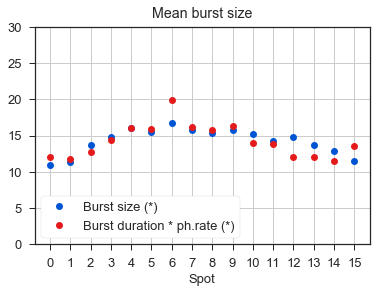

In [94]:
sim_mean_bsw = (mean_bww * mmrw) * mean_bsw.mean() / (mean_bww * mmrw).mean()
linplot16(mean_bsw, label='Burst size (*)', title='Mean burst size')
linplot16(sim_mean_bsw, label='Burst duration * ph.rate (*)', ax=plt.gca())
leg = plt.legend(loc='lower left', frameon=True)
leg.get_frame().set(facecolor='w', alpha=1)
plt.ylim(0, 30);

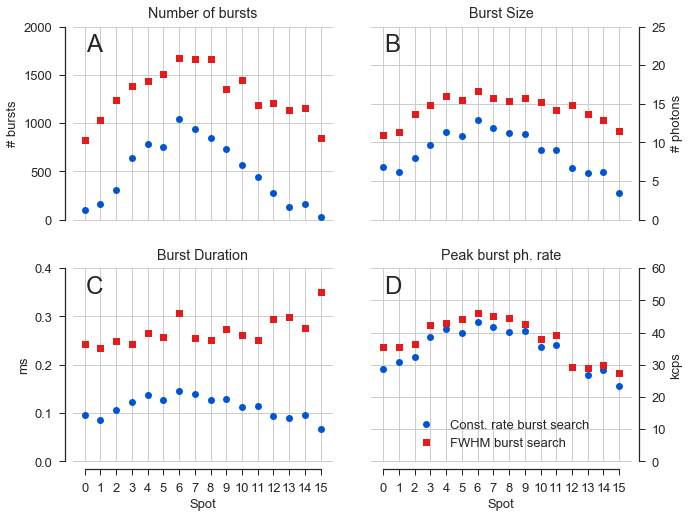

In [95]:
fig, ax = plt.subplots(2, 2, figsize=(10, 8), sharex=False)

linplot16(ds.num_bursts, title='Number of bursts', label='Const. rate burst search', ax=ax[0,0])
linplot16(dsw.num_bursts, label='FWHM burst search', marker='s', ax=ax[0,0])
ax[0,0].set(ylim=(0, 2000), ylabel='# bursts')

linplot16(mean_bs, title='Burst Size', label='Const. rate burst search', ax=ax[0,1])
linplot16(mean_bsw, label='FWHM burst search', marker='s', ax=ax[0,1])
ax[0,1].set(ylim=(0, 25), ylabel='# photons')

linplot16(mean_bw, title='Burst Duration', label='Const. rate burst search', ax=ax[1,0])
linplot16(mean_bww, label='FWHM burst search', marker='s', ax=ax[1,0])
ax[1,0].set(ylim=(0, 0.4), ylabel='ms')

linplot16(mmr, title='Peak burst ph. rate', label='Const. rate burst search', ax=ax[1,1])
linplot16(mmrw, label='FWHM burst search', marker='s', ax=ax[1,1])
ax[1,1].set(ylim=(0, 60), ylabel='kcps')

sns.despine(ax=ax[0, 0], left=False, right=True, bottom=True, trim=True, offset=8)
sns.despine(ax=ax[0, 1], left=True, right=False, bottom=True, trim=True, offset=8)
sns.despine(ax=ax[1, 0], left=False, right=True, bottom=False, trim=True, offset=8)
sns.despine(ax=ax[1, 1], left=True, right=False, bottom=False, trim=True, offset=8)

for p, a in zip('ABCD', ax.ravel()):
    a.grid(True)
    a.text(0.05, 0.87, p, fontsize=24, transform=a.transAxes)

for a in ax[0]:
    a.set(xlabel='')
    a.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off') # labels along the bottom edge are off
for a in ax[:, 1]:
    a.yaxis.set_label_position("right")
    a.yaxis.set_ticks_position('right')
leg = ax[1,1].legend(loc='lower center', frameon=False)
leg.get_frame().set(facecolor='w', alpha=1)
plt.subplots_adjust(hspace=0.25, wspace=0.15)
savefig('burst_stats.png')

## Other 16-ch figures

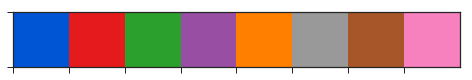

In [96]:
sns.palplot(sns.color_palette())

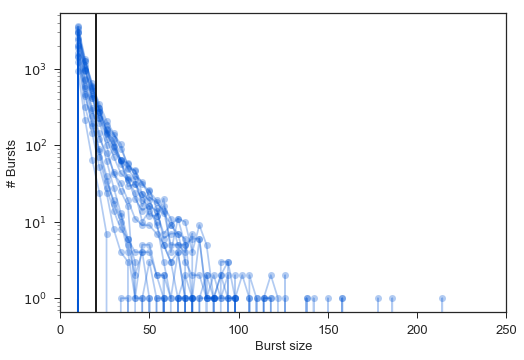

In [97]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_size(d, i=ich, color='C0', plot_style=plt_kws, legend=False, pdf=False)
plt.xlim(0, 250)
plt.axvline(20, color='k')

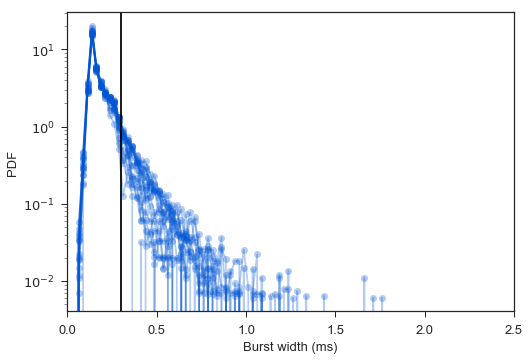

In [98]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_width(d, i=ich, color='C0', plot_style=plt_kws)
plt.xlim(0, 2.5)
plt.axvline(0.3, color='k')

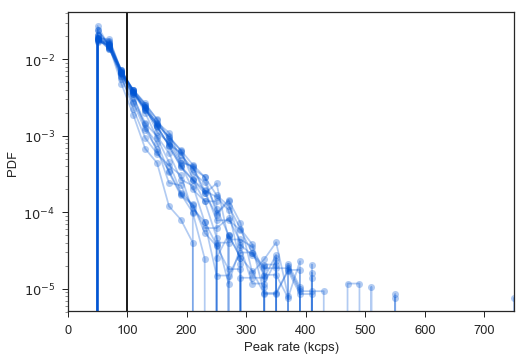

In [99]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_burst_phrate(d, i=ich, color='C0', plot_style=plt_kws)
plt.xlim(0, 750)
plt.axvline(100, color='k')

# TCSPC Nanotimes

The nanotimes for the measurement is saved in the `.nanotimes` 
attribute of the `Data()` object (here either `d` or `ds`).

As an example here we get the array of nanotimes for all photons, 
donor emission and acceptor emission:

In [100]:
d.nanotimes

[array([ 7113,  4902,  3637, ..., 11685,  3510,  3596], dtype=uint16),
 array([ 4529, 10855,  4238, ...,  3409,  3616,  3650], dtype=uint16),
 array([4166, 3669, 6187, ..., 3706, 3660, 3762], dtype=uint16),
 array([2998, 2815, 4297, ..., 9728, 2856, 2529], dtype=uint16),
 array([ 3460,  2661,  3284, ...,  9606,  3284, 12590], dtype=uint16),
 array([4317, 3061, 3628, ..., 3929, 3220, 3987], dtype=uint16),
 array([3456, 3337, 3411, ..., 4292, 7398, 5515], dtype=uint16),
 array([3723, 3160, 3226, ..., 2858, 3169, 3188], dtype=uint16),
 array([3679, 3479, 3752, ..., 4345, 3455, 3570], dtype=uint16),
 array([3597, 4236, 3523, ..., 3502, 4620, 3520], dtype=uint16),
 array([3511, 3777, 3390, ..., 3517, 3579, 8663], dtype=uint16),
 array([3718, 5483, 4245, ..., 2926, 3949, 3047], dtype=uint16),
 array([4127, 3109, 3235, ..., 3817, 3279, 3493], dtype=uint16),
 array([3690, 3867, 3304, ..., 4308, 2993, 3518], dtype=uint16),
 array([ 3472,  3533,  4035, ...,  9344, 11002,  3135], dtype=uint16),
 

In [101]:
ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich()

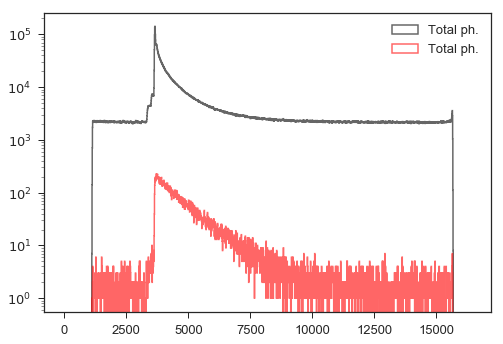

In [102]:
hist_params = dict(bins=range(0, 2**14, 8), histtype='step', alpha=0.6, lw=1.5)
hist(d.nanotimes[0], color='k', label='Total ph.', **hist_params)
hist(d.nanotimes[0][ph_in_bursts_mask], color='r', label='Total ph.', **hist_params)
plt.legend()
plt.yscale('log')

In [103]:
tcspc_unit = [p['tcspc_unit'] for p in ds.nanotimes_params]
len(tcspc_unit), tcspc_unit[:3]

(16, [3.332e-12, 3.345e-12, 3.414e-12])

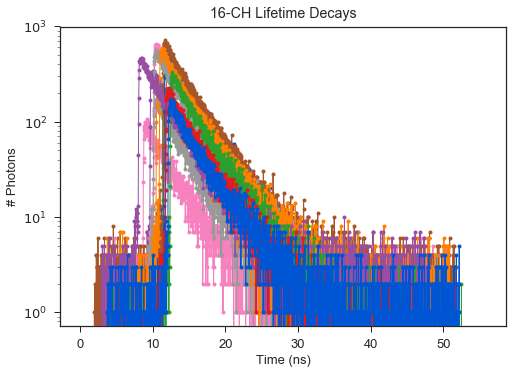

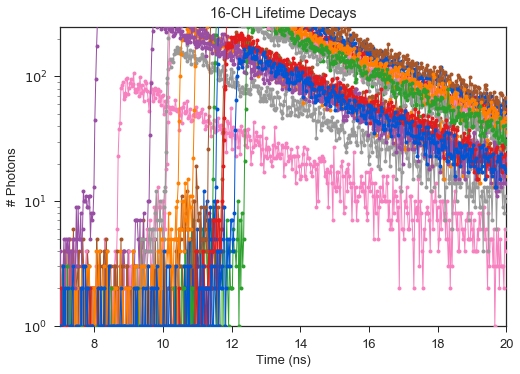

In [104]:
bins_r=np.arange(0, 2**14, 8)
kws = dict(marker='o', ms=4, lw=1, alpha=1)
for i in range(16):
    unit = tcspc_unit[i] * 1e9
    ph_in_bursts_mask = d.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask] * unit
    counts, bins = np.histogram(ntimes, bins=bins_r*unit)
    plt.plot(bins[1:], counts, zorder=20-i, **kws)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
display(plt.gcf())
plt.xlim(7, 20)
plt.ylim(0, 250);

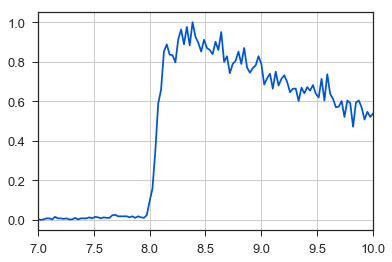

In [105]:
i = 3
unit = tcspc_unit[i] * 1e9
ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
ntimes = d.nanotimes[i][ph_in_bursts_mask]
t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8)

%matplotlib inline

plt.plot(t, counts/counts.max())
#plt.xlim(9, 12)
plt.xlim(7, 10)
plt.grid()

In [106]:
kws = dict(idxmin=0, idxmax=2**14, rmin=0.1, rmax=0.7, cross_th=0.5, rebin=8, pdf=False)
offset_ns0 = calc_offset_ns_mch(d, inbursts=True, subtract_min=False, **kws)
offset_ns0

array([ 12.13107156,  11.80638146,  12.42884359,   8.06352   ,
        10.94736851,  10.1493981 ,  11.38350893,  10.19826727,
        11.60058167,  11.83152273,  11.51882152,   9.65881108,
        10.4996736 ,  10.10088677,  11.76125   ,   8.73824492])

In [107]:
kws = dict(idxmin=0, idxmax=2**14, rmin=0.1, rmax=0.8, cross_th=0.5, rebin=8, pdf=False)
offset_ns_dsw = calc_offset_ns_mch(dsw, inbursts=True, subtract_min=False, **kws)
offset_ns_dsw

array([ 12.12645183,  11.80753143,  12.42629709,   8.06686957,
        10.95341435,  10.15372371,  11.38766797,  10.196576  ,
        11.60287022,  11.83386076,  11.51728724,   9.65510886,
        10.48873119,  10.0914644 ,  11.76268658,   8.71805272])

In [108]:
offset_ns0.min()

8.0635200000000005

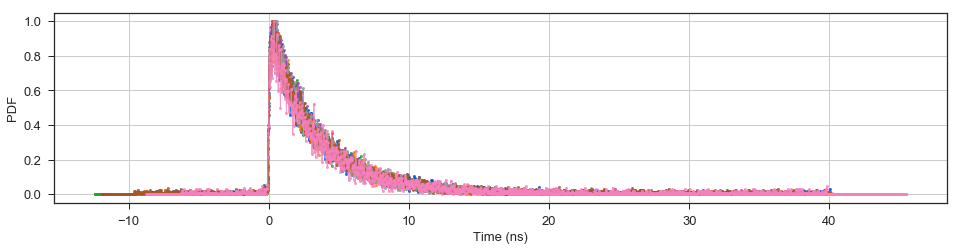

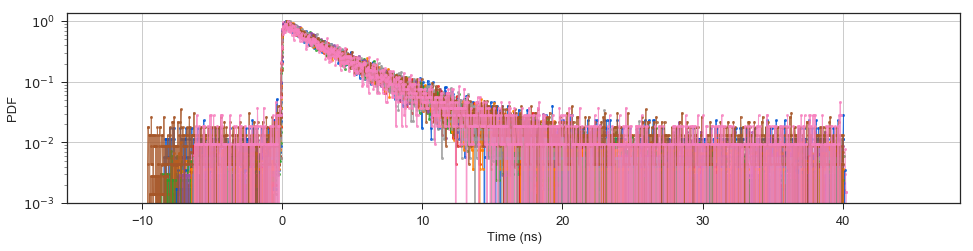

In [109]:
channels = range(16)
pdf = True
fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=0.8)
for i in channels:
    t, counts = tcspc.calc_nanotime_hist_ich_ns(d, ich=i, inbursts=True, rebin=8, offset=offset_ns0[i], pdf=pdf)
    plt.plot(t, counts/counts.max(), label='CH%d' % i, color='C%d' % (i % 8), **kws)
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.grid(True)
display(fig)
plt.yscale('log')

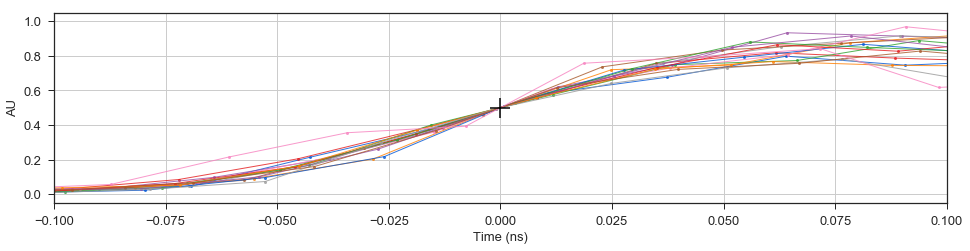

In [110]:
channels = range(16)
pdf = True
fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=0.8)
for i in channels:
    t, counts = tcspc.calc_nanotime_hist_ich_ns(d, ich=i, inbursts=True, rebin=8, offset=offset_ns0[i], pdf=pdf)
    plt.plot(t, counts/counts.max(), label='CH%d' % i, color='C%d' % (i % 8), **kws)
plt.xlabel('Time (ns)')
plt.ylabel('AU')
plt.grid(True)
plt.xlim(-0.1, 0.1);
plt.plot(0, 0.5, '+', mew=1.5, ms=20, color='k')

In [111]:
# channels = range(16)
# pdf = True

# kws = dict(marker='o', ms=3, lw=1, alpha=0.8)
# for i in channels:
#     fig = plt.figure(figsize=(16, 3.5))
#     unit = tcspc_unit[i] * 1e9
#     ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
#     ntimes = d.nanotimes[i][ph_in_bursts_mask]
#     t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns0[i])
#     plt.plot(t, counts/counts.max(), label='CH%d' % i, color='C%d' % (i % 8), **kws)
#     plt.plot(0, 0.5, '+', mew=1.5, ms=20, color='k')
#     plt.xlabel('Time (ns)')
#     plt.ylabel('PDF' if pdf else '# Photons')
#     plt.legend()
#     plt.grid(True)
#     plt.yscale('linear')
#     plt.xlim(-0.2, 0.2);
#     display(fig)
#     plt.close(fig)

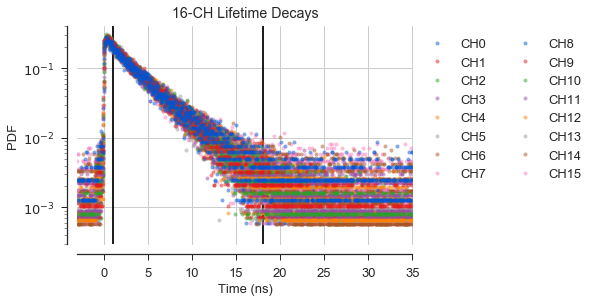

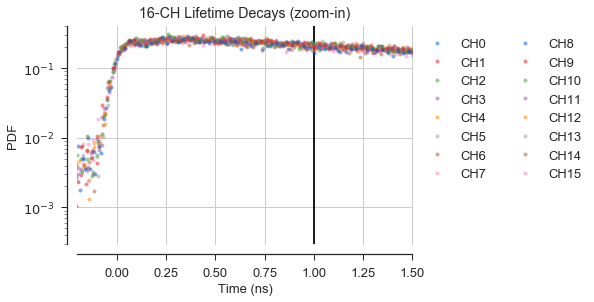

In [112]:
pdf = True
kws = dict(marker='o', ms=4, lw=0, alpha=0.5)
for i in range(16):
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns_dsw[i], pdf=pdf)
    plt.plot(t, counts, zorder=20-i, label='CH%d' % i, **kws)

plt.xlim(-3, 35)
plt.ylim(3e-4, 0.4)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
plt.grid(True)
plt.axvline(1, color='k')
plt.axvline(18, color='k')
sns.despine(trim=False, offset=10)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=2);
savefig('sm_inbursts_lifetime_decays_legend.png')
display(plt.gcf())
plt.xlim(-0.2, 1.5)
plt.title('16-CH Lifetime Decays (zoom-in)', va='bottom');

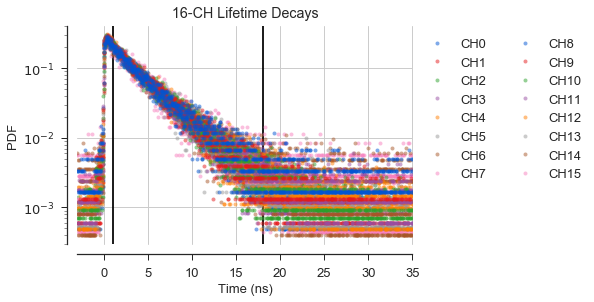

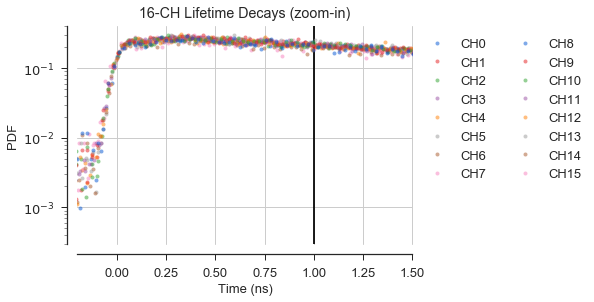

In [113]:
pdf = True
kws = dict(marker='o', ms=4, lw=0, alpha=0.5)
for i in range(16):
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = d.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns0[i], pdf=pdf)
    plt.plot(t, counts, zorder=20-i, label='CH%d' % i, **kws)

plt.xlim(-3, 35)
plt.ylim(3e-4, 0.4)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
plt.grid(True)
plt.axvline(1, color='k')
plt.axvline(18, color='k')
sns.despine(trim=False, offset=10)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=2);
savefig('sm_inbursts_lifetime_decays_legend.png')
display(plt.gcf())
plt.xlim(-0.2, 1.5)
plt.title('16-CH Lifetime Decays (zoom-in)', va='bottom');

## Burst mean lifetime

In [114]:
def calc_mean_lifetime(dx, t1=0, t2=np.inf, ph_sel=Ph_sel('all'), offsets=None):
    """Compute the mean lifetime in each burst.

    Arguments:
        t1, t2 (floats): min and max value (in seconds) for the
            nanotime to be included in the mean
        ph_sel (Ph_sel object): object defining the photon selection.
            See :mod:`fretbursts.ph_sel` for details.

    Returns:
        List of arrays of per-burst mean lifetime in seconds. One array per channel.
    """
    if offsets is None:
        offsets = np.zeros(d.nch)
    mean_lifetimes = []
    units = [p['tcspc_unit'] for p in dx.nanotimes_params]
    for ich, (bursts, nanot, mask) in enumerate(zip(dx.mburst, dx.nanotimes, dx.iter_ph_masks(ph_sel))):
        nanot_s = (nanot * units[ich]) - offsets[ich]
        selection = (nanot_s > t1) * (nanot_s < t2)
    
        # Select photons in ph_sel AND with nanotime in [t1, t2]
        if bl.isarray(mask):
            selection *= mask
        mean_lifetimes.append(
            bl.burst_ph_stats(nanot_s, bursts, mask=selection, func=np.mean) - t1
        )
    return mean_lifetimes

In [115]:
ds40 = d.select_bursts(select_bursts.size, th1=40)

In [116]:
t1, t2 = 1, 18
dx = ds
mlt = [m*1e9 for m in calc_mean_lifetime(dx, t1=t1*1e-9, t2=t2*1e-9, offsets=offset_ns0*1e-9)]
widths = 0.9 * dx.num_bursts / dx.num_bursts.max()

In [117]:
t1, t2 = 1, 18
dx = ds40
mlt40 = [m*1e9 for m in calc_mean_lifetime(dx, t1=t1*1e-9, t2=t2*1e-9, offsets=offset_ns0*1e-9)]
widths40 = 0.9 * dx.num_bursts / dx.num_bursts.max()

In [118]:
t1, t2 = 1, 18
dx = dsw
mltw = [m*1e9 for m in calc_mean_lifetime(dx, t1=t1*1e-9, t2=t2*1e-9, offsets=offset_ns0*1e-9)]
widthsw = 0.9 * dx.num_bursts / dx.num_bursts.max()

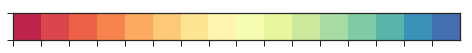

In [119]:
colors = sns.color_palette('Spectral', 16)
sns.palplot(colors, size=0.5)

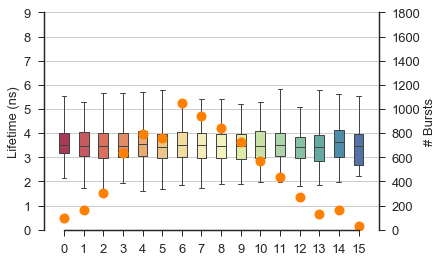

In [120]:
sns.boxplot(data=mlt, palette=colors, linewidth=1, width=0.5, whis=(1, 99), showfliers=False);
ax1 = plt.gca()
ax1.grid(axis='y')

nticks = 10
ax1.set(ylim=(0, nticks-1), ylabel='Lifetime (ns)')

ax2 = plt.twinx()
ax2.plot(ds.num_bursts, 'C4o', ms=10)
ax2.set(ylim=(0, (ds.num_bursts.max() / nticks // 100) * (nticks - 1) * 2 * 100), ylabel='# Bursts')

nticks = 10
ax1.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax2.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
sns.despine(right=False, trim=True)

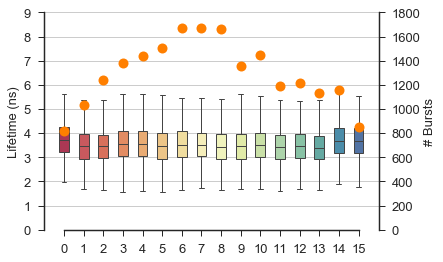

In [121]:
sns.boxplot(data=mltw, palette=colors, linewidth=1, width=0.5, whis=(1, 99), showfliers=False);
ax1 = plt.gca()
ax1.grid(axis='y')

nticks = 10
ax1.set(ylim=(0, nticks-1), ylabel='Lifetime (ns)')

ax2 = plt.twinx()
ax2.plot(dsw.num_bursts, 'C4o', ms=10)
ax2.set(ylim=(0, (dsw.num_bursts.max() / nticks // 100) * (nticks - 1) * 2 * 100), ylabel='# Bursts')

nticks = 10
ax1.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax2.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
sns.despine(right=False, trim=True)

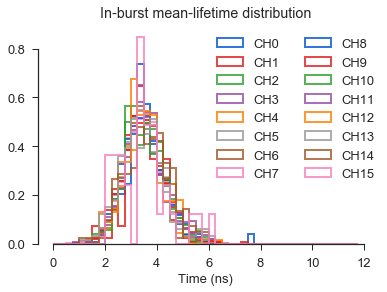

In [122]:
channels = range(16)
hist_params = dict(bins=np.arange(0, 12, 0.25), histtype='step', alpha=0.8, lw=2, normed=True)
for i in channels:
    meanlife = mlt[i][~np.isnan(mlt[i])]
    plt.hist(meanlife, label='CH%d'%i, **hist_params);

#plt.xlim(0, 12)
plt.xlabel('Time (ns)')
plt.title('In-burst mean-lifetime distribution', va='bottom');
plt.legend(bbox_to_anchor=(0.5, 1), loc='upper left', ncol=2);
sns.despine(trim=True)

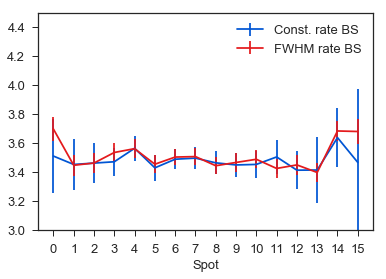

In [123]:
mean_life = mlt
ml_mean = [np.mean(m) for m in mean_life]
ml_median = [np.median(m) for m in mean_life]
ml_std = [3*np.std(m)/(np.sqrt(m.size)) for m in mean_life]
plt.errorbar(range(16), ml_median, yerr=ml_std, label='Const. rate BS');
plt.ylim(3, 4.5)
mean_life = mltw
ml_meanw = [np.mean(m) for m in mean_life]
ml_medianw = [np.median(m) for m in mean_life]
ml_stdw = [3*np.std(m)/(np.sqrt(m.size)) for m in mean_life]
plt.errorbar(range(16), ml_medianw, yerr=ml_stdw, label='FWHM rate BS');
plt.gca().set(ylim=(3, 4.5), xticks=(range(16)), xlabel='Spot')
plt.legend();

(3.4821392673733955, 0.055026553793328617)

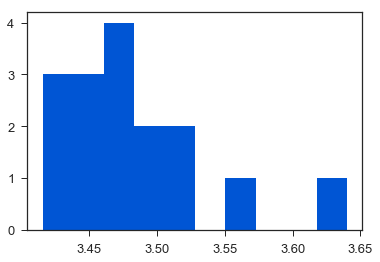

In [124]:
plt.hist(ml_median)
np.mean(ml_median), np.std(ml_median)

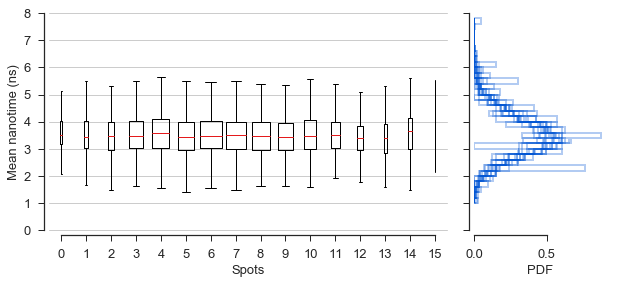

In [125]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.1)

ax[0].boxplot(mlt, positions=range(16), widths=widths);
ax[0].set(ylim=(0, 8), ylabel='Mean nanotime (ns)', xlabel='Spots')

channels = range(16)
hist_params = dict(bins=np.arange(1, 8, 0.2),  normed=True, histtype='step', 
                   alpha=0.3, lw=2, color='C0',
                   orientation='horizontal')
for i in channels:
    meanlife = mlt[i]
    ax[1].hist(meanlife, label='CH%d'%i, **hist_params);

ax[1].set(xlabel='PDF')
#ax[1].legend(bbox_to_anchor=(0.5, 1), loc='upper left', ncol=1);
for a in ax:
    sns.despine(ax=a, trim=True, offset=5)
plt.setp(a.get_yticklabels(), visible=False);
ax[0].grid(axis='y')

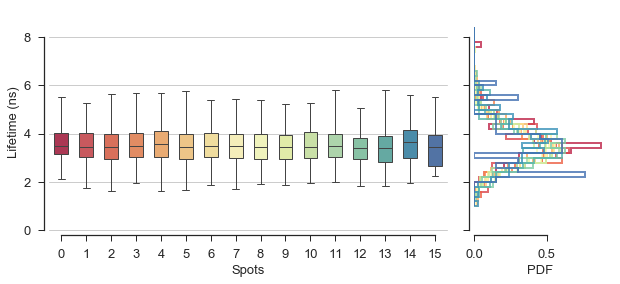

In [126]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.1)

sns.boxplot(data=mlt, ax=ax[0], whis=(1, 99), showfliers=False,
            palette=colors, linewidth=1, width=0.55);
ax[0].set(ylim=(0, 9), ylabel='Lifetime (ns)', xlabel='Spots')

channels = range(16)
hist_params = dict(bins=np.arange(1, 8.6, 0.2),  normed=True, histtype='step', 
                   alpha=0.8, lw=2, #color='C0',
                   orientation='horizontal')
for i in channels:
    meanlife = mlt[i]
    ax[1].hist(meanlife, label='CH%d'%i, color=colors[i], **hist_params);

ax[1].set(xlabel='PDF')
for a in ax:
    sns.despine(ax=a, trim=True, offset=5)
plt.setp(a.get_yticklabels(), visible=False);
ax[0].grid(axis='y')

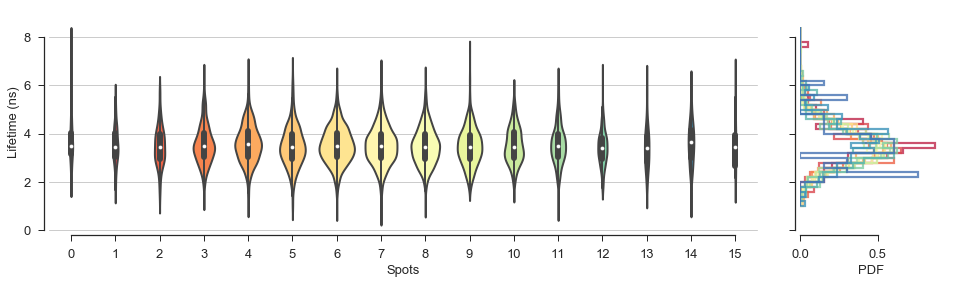

In [127]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4), sharey=True, gridspec_kw={'width_ratios': [5, 1]})
plt.subplots_adjust(wspace=0.1)

sns.violinplot(data=mlt, ax=ax[0], saturation=1, scale='count',
               palette=colors, linewidth=2);
ax[0].set(ylim=(0, 9), ylabel='Lifetime (ns)', xlabel='Spots')

channels = range(16)
hist_params = dict(bins=np.arange(1, 8.6, 0.2),  normed=True, histtype='step', 
                   alpha=0.8, lw=2.2, #color='C0',
                   orientation='horizontal')
for i in channels:
    meanlife = mlt[i]
    ax[1].hist(meanlife, label='CH%d'%i, color=colors[i], **hist_params);

ax[1].set(xlabel='PDF')
for a in ax:
    sns.despine(ax=a, trim=True, offset=5)
plt.setp(a.get_yticklabels(), visible=False);
ax[0].grid(axis='y')
savefig('mean in-burst lifetime violin hist.png')

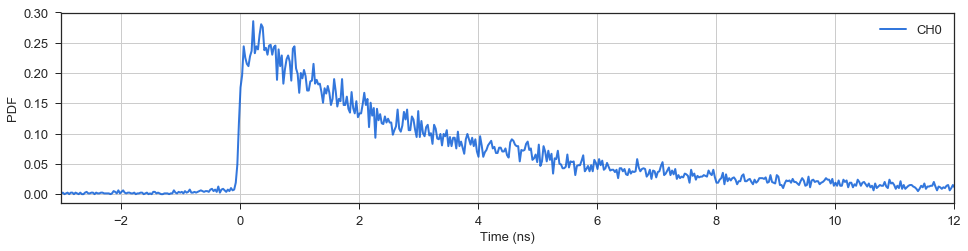

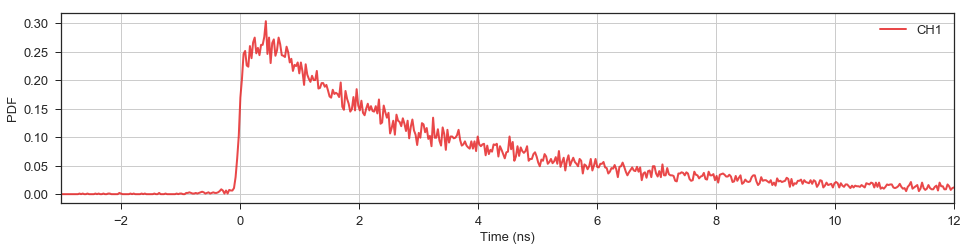

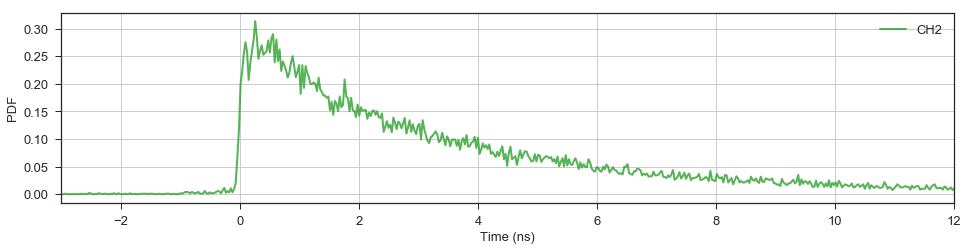

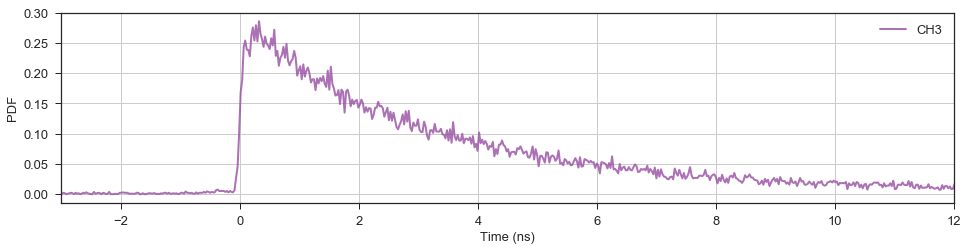

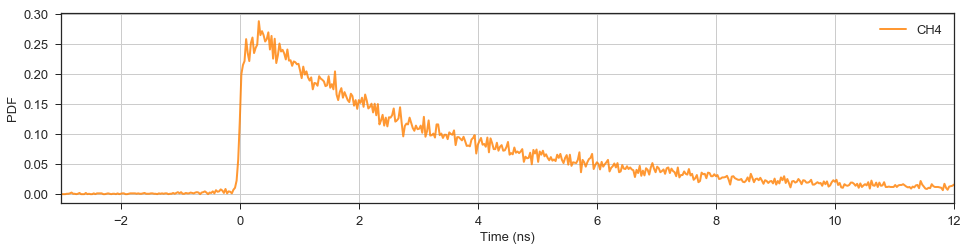

...

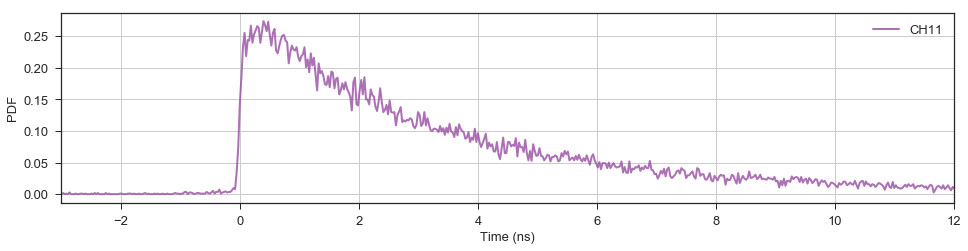

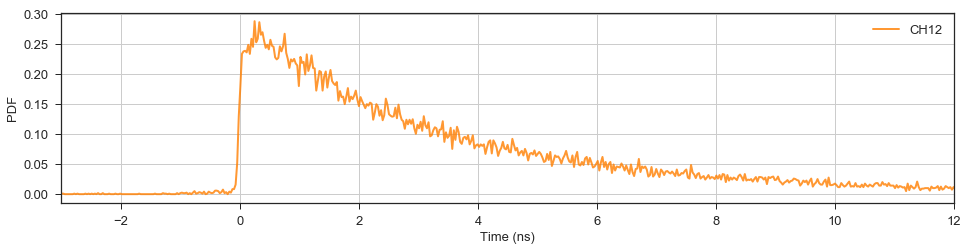

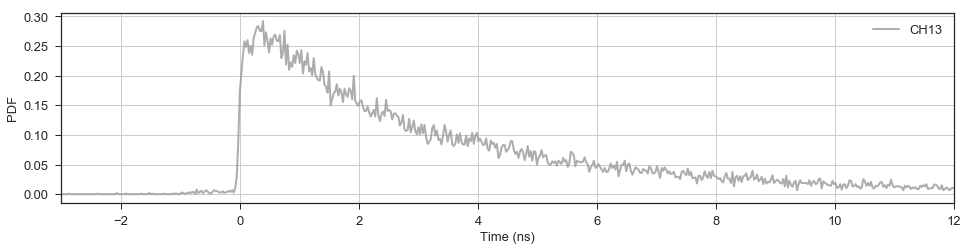

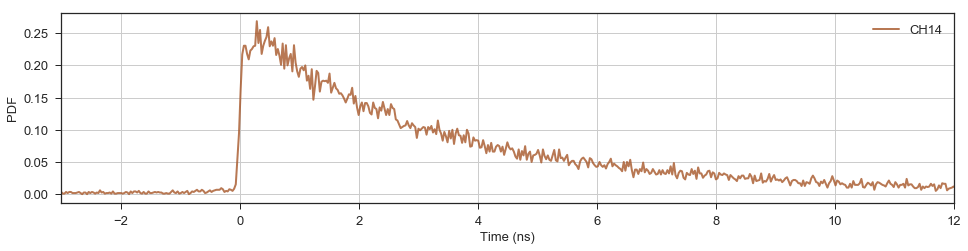

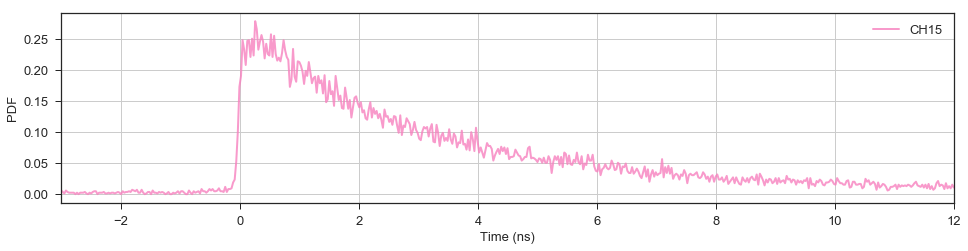

In [128]:
channels = range(16)
pdf = True
kws = dict(marker='o', ms=0, lw=2, alpha=0.8)
for i in channels:
    fig = plt.figure(figsize=(16, 3.5))
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns0[i], pdf=pdf)

    plt.plot(t, counts, label='CH%d' % i, color='C%d' % (i % 8), **kws)
    plt.legend()
    plt.grid(True)
    #plt.yscale('log')
    plt.xlabel('Time (ns)')
    plt.ylabel('PDF' if pdf else '# Photons')
    plt.xlim(-3, 12);

## Population Lifetime Fit

In [129]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [130]:
import lmfit
lmfit.__version__

'0.9.5'

In [131]:
import pybroom as br

In [132]:
pd.options.display.max_rows = 16

### Tail Fit

In [133]:
def func_exp_baseline2(t, tau, ampl1, ampl2):
    return ampl1 * np.exp(-t/tau) + ampl2

def func_exp_baseline(t, tau, alpha, ts, ampl):
    return ampl * pdf_exp_baseline(t, tau, alpha, ts)

def pdf_exp_baseline(t, tau, alpha, ts):
    return alpha * (np.exp(-t/tau) / tau) + (1-alpha) / ts

def logll_exp_baseline(t, tau, alpha, ts):
    return np.log(pdf_exp_baseline(t, tau, alpha, ts)).sum()

def minimze_loglike(params, t, ts):
    tau = params['tau'].value
    alpha = params['alpha'].value
    return logll_exp_baseline(t, tau, alpha, ts)

def hist_residuals(params, hist_data, bin_centers, weight=False):
    residuals = (hist_data - func_exp_baseline2(bin_centers, **params.valuesdict()))
    if weight:
        weights = 1/(np.sqrt(hist_data) + 0.1)
        residuals *= weights
    return residuals

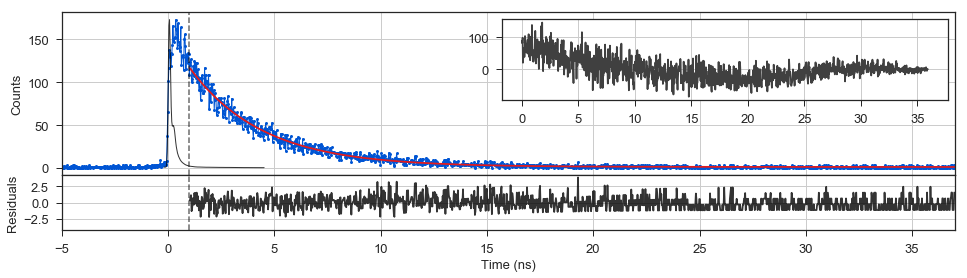

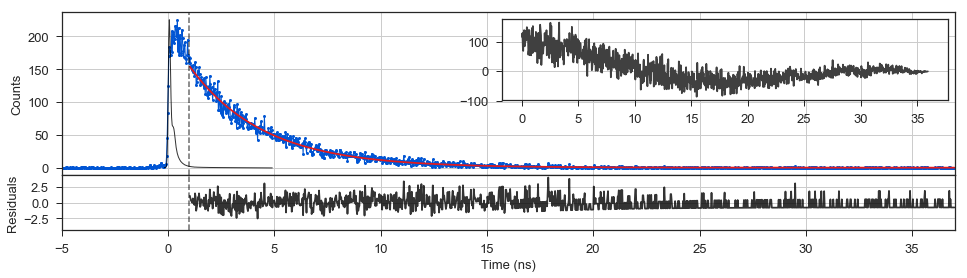

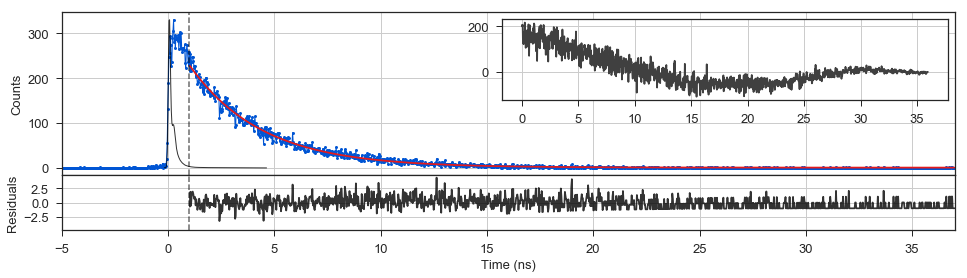

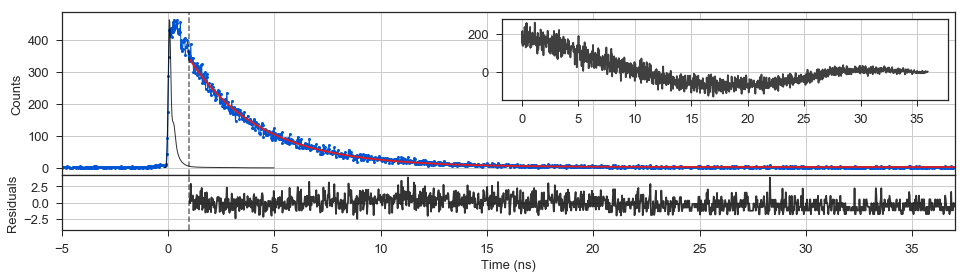

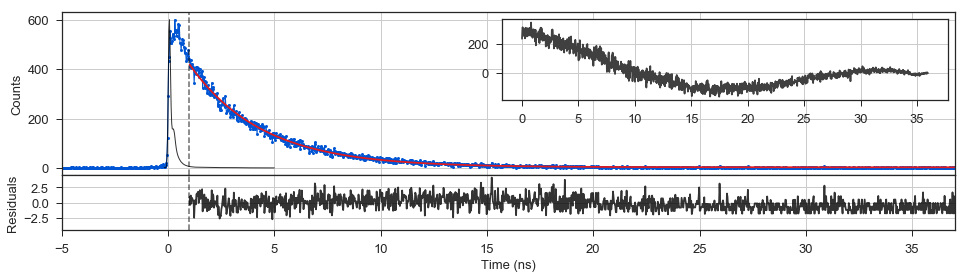

...

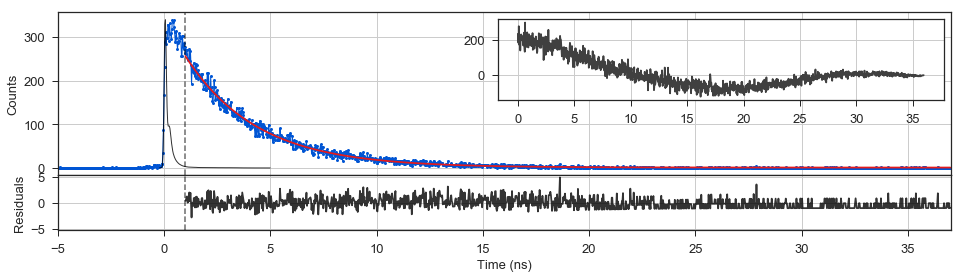

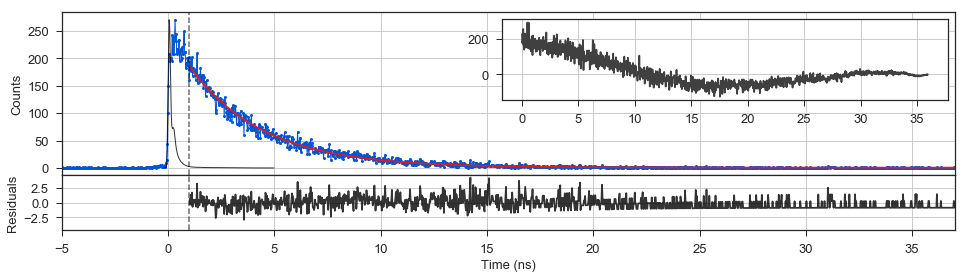

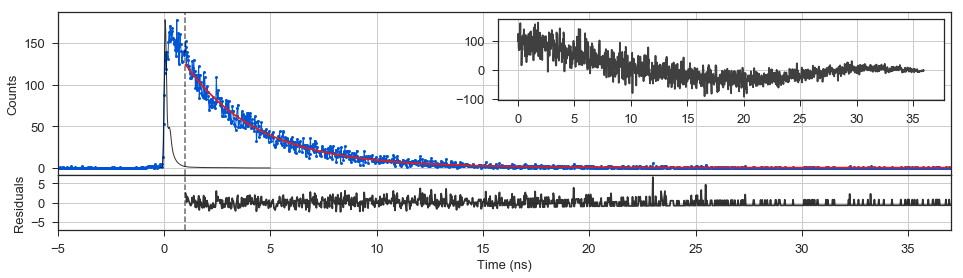

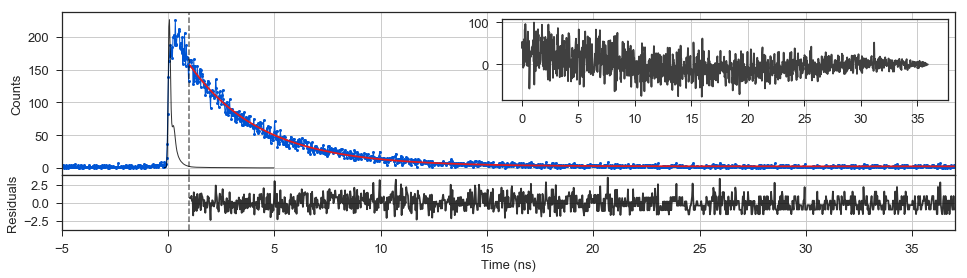

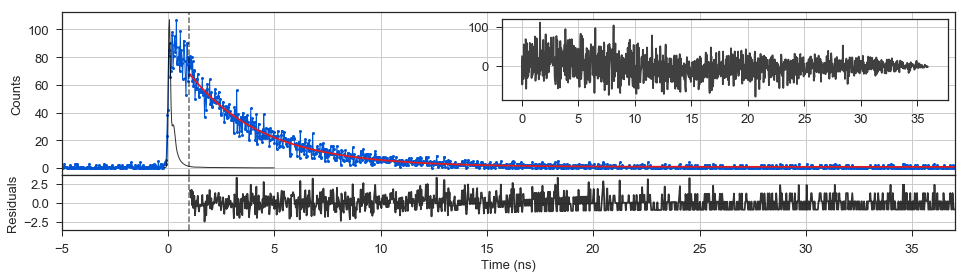

In [134]:
t1, t2 = 1, 37
weight = False
dx = d
channels = range(16)

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)

params0 = lmfit.Parameters()
params0.add('tau', min=1, max=9, value=4)
params0.add('ampl1', min=0, value=1000)
params0.add('ampl2', min=0, value=10)

rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 5      # ns, end time of the IRF from t @ 0.5 of peak value
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich], pdf=False)
    bins_c, lifet_hist = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
    hist_mask = (bins_c >= t1) * (bins_c <= t2)
    x_model = bins_c[hist_mask]
    lifet_hist_sel = lifet_hist[hist_mask]#.astype('float')
    
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'hist_data': lifet_hist_sel, 'bin_centers': x_model - t1, 'weight': weight}
    res = lmfit.minimize(hist_residuals, params0, kws=fitfunc_kws, method='melder')
    res_bulk[ich] = res
    
    y_model = func_exp_baseline2(x_model - t1,  **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(bins_c, lifet_hist, label='CH%d data' % ich, **kws)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist.max(), color='k', alpha=0.8, lw=1)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    #ax[1].set_ylim(-60, 60)
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(-5, t2)
    ax[0].legend()
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [135]:
popfitg = br.glance(res_bulk, var_names='spot')
popfit = br.tidy(res_bulk, var_names='spot')

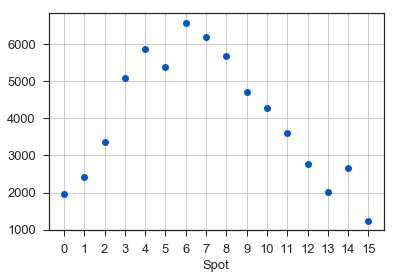

In [136]:
linplot16(d.num_bursts)

(3.2, 3.8)

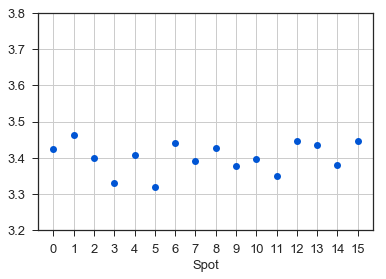

In [137]:
linplot16(np.array(popfit.loc[popfit.name == 'tau', 'value']))
plt.ylim(3.2, 3.8)

### Convolution fit

In [138]:
def model_1exp_conv(x, tau, ampl, baseline, offset, irf):
    """
    Model function used to fit the data.
    """
    y = np.zeros(x.size)
    pos_range = (x - offset) >= 0
    y[pos_range] = ampl*np.exp(-(x[pos_range] - offset)/tau)
    z = np.convolve(y, irf, mode='same')
    z += baseline
    return z

def model_2exp_conv(x, tau1, ampl1, tau2, ampl2, baseline, offset, irf):
    """
    Model function used to fit the data.
    """
    y = np.zeros(x.size)
    pos_range = (x - offset) >= 0
    y[pos_range] = ampl1*(np.exp(-(x[pos_range] - offset)/tau1)) + \
                   ampl2*(np.exp(-(x[pos_range] - offset)/tau2))
    z = np.convolve(y, irf, mode='same')
    z += baseline
    return z

def model_3exp_conv(x, tau1, ampl1, tau2, ampl2, tau3, ampl3, baseline, offset, irf):
    """
    Model function used to fit the data.
    """
    y = np.zeros(x.size)
    pos_range = (x - offset) >= 0
    y[pos_range] = ampl1*(np.exp(-(x[pos_range] - offset)/tau1)) + \
                   ampl2*(np.exp(-(x[pos_range] - offset)/tau2)) + \
                   ampl3*(np.exp(-(x[pos_range] - offset)/tau3))
    z = np.convolve(y, irf, mode='same')
    z += baseline
    return z


def residuals_func(params, x, y, weight, irf, model_func):
    """
    Returns the array of residuals for the current parameters.
    """
    resid = (y - model_func(x, irf=irf, **params.valuesdict()))
    if weight:
        resid /= np.sqrt(y + 1)
    return resid

#### Single-channel test

In [139]:
ich = 5

t1, t2 = -3, 37
dx = d
weight = False
channels = range(16)
model = model_1exp_conv

params0 = lmfit.Parameters()
params0.add('tau', min=1, max=9, value=3.6)
params0.add('ampl', min=0, value=20)
params0.add('baseline', min=0, value=1)
params0.add('offset', value=2)

kws = dict(marker='o', ms=3, lw=1, alpha=1)

rebin = 8
#bins_raw_irf = np.arange(0, 2**14, rebin)
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 5      # ns, end time of the IRF from t @ 0.5 of peak value

In [140]:
unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
nanot = dx.nanotimes[ich][ph_in_bursts_mask]
lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich],
                 t_start=t1, t_stop=t2, pdf=False)
x_model, lifet_hist_sel = tcspc.calc_nanotime_hist(nanot, **lifet_kws)

irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
               t_start=irf_start, t_stop=irf_stop, pdf=True)
x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

In [141]:
x_model.shape, lifet_hist_sel.shape

((1506,), (1506,))

In [142]:
x_irf.shape, irf_pdf.shape

((195,), (195,))

In [143]:
np.trapz(irf_pdf, x=x_irf)

0.99980982478545866

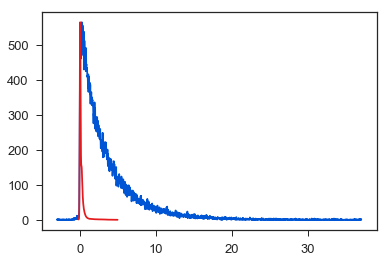

In [144]:
plt.plot(x_model, lifet_hist_sel)
plt.plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist_sel.max())

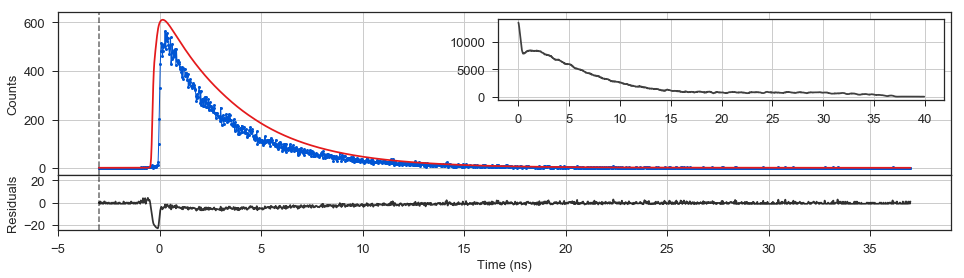

In [145]:
params = params0
#params = res.params
y_model = model(x_model, irf=irf_pdf, **params0.valuesdict())
residuals = lifet_hist_sel - y_model
residuals_scaled = residuals / np.sqrt(y_model)
residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')

residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0)
inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
inax.plot(residuals_corr_t, residuals_corr, color='0.25')
inax.grid()
ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws) #color='C%d' % (i % 8), **kws)
ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
#ax[1].set_ylim(-60, 60)
ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
ax[0].set_ylabel('Counts')
#ax[0].set_xlim(5, 25)
ax[0].legend()
for a in ax:
    a.grid()
    a.axvline(t1, color='k', ls='--', alpha=0.5)

In [146]:
weights = np.ones_like(x_model)
fitfunc_kws={'y': lifet_hist_sel, 'x': x_model, 'model_func': model, 'weight': weight, 'irf': irf_pdf}
res = lmfit.minimize(residuals_func, params0, kws=fitfunc_kws, method='nelder')

In [147]:
res.params.valuesdict()

OrderedDict([('tau', 2.8645230546727354),
             ('ampl', 16.403571392594571),
             ('baseline', 0.97543227169157865),
             ('offset', 2.2939618997436995)])

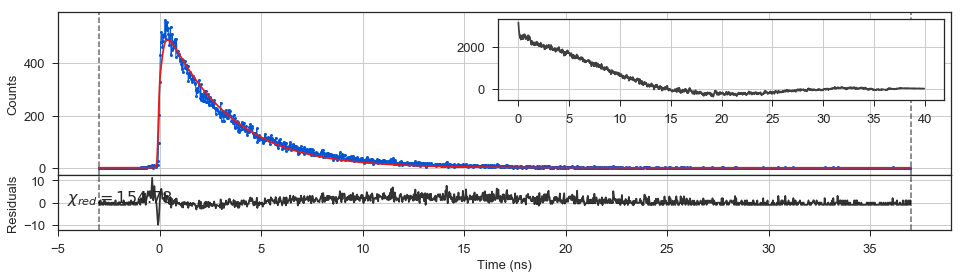

In [148]:
res_bulk[ich] = res

y_model = model(x_model,  irf=irf_pdf, **res.params.valuesdict())
residuals = lifet_hist_sel - y_model
residuals_scaled = residuals / np.sqrt(y_model)
residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0)
inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
inax.plot(residuals_corr_t, residuals_corr, color='0.25')
inax.grid()
ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws) #color='C%d' % (i % 8), **kws)
ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
#ax[1].set_ylim(-60, 60)
ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
ax[0].set_ylabel('Counts')
#ax[0].set_xlim(5, 25)
#ax[0].legend()
for a in ax:
    a.grid()
    a.axvline(t1, color='k', ls='--', alpha=0.5)
    a.axvline(t2, color='k', ls='--', alpha=0.5)
ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

#### 1-exponential

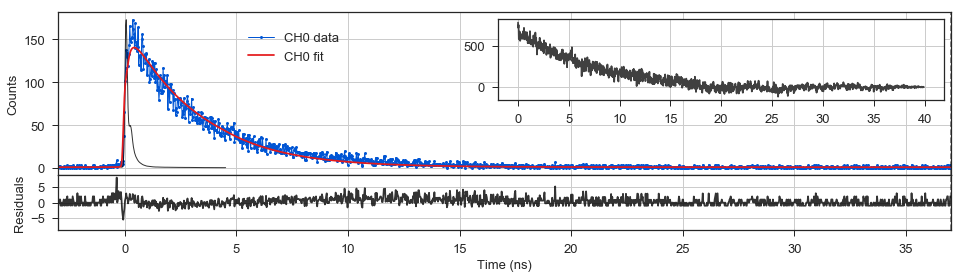

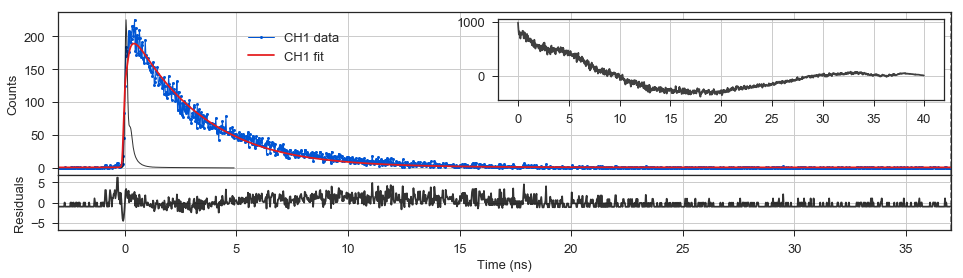

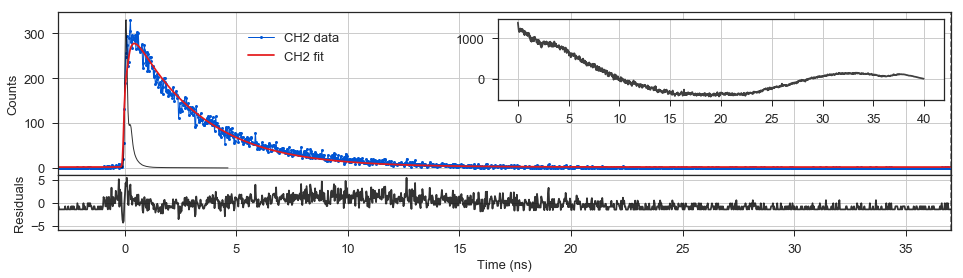

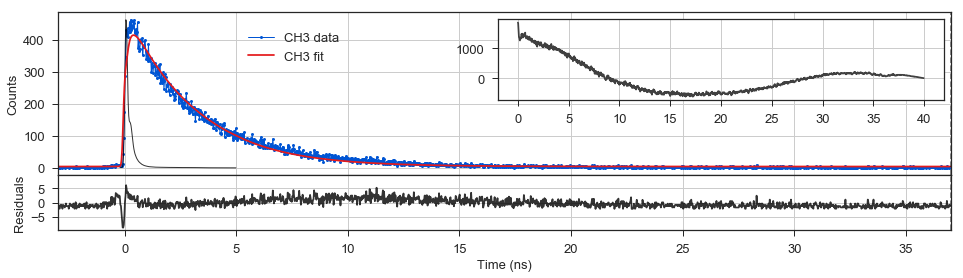

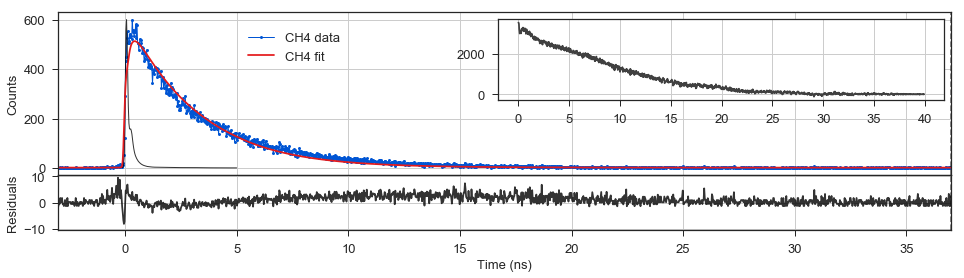

...

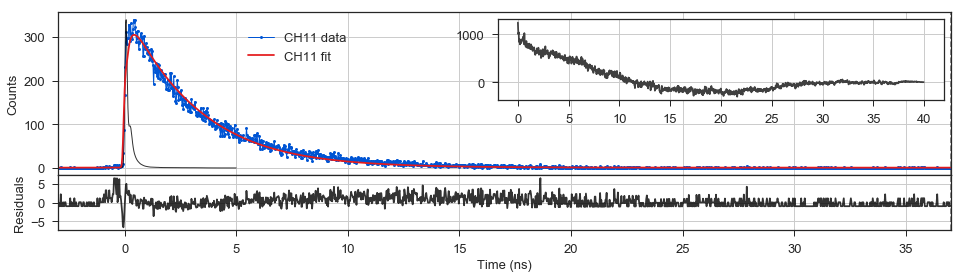

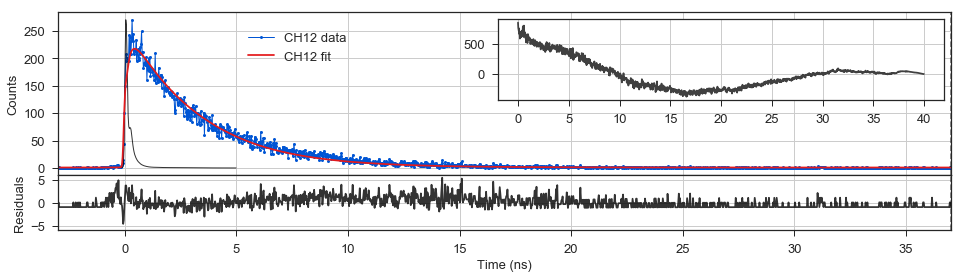

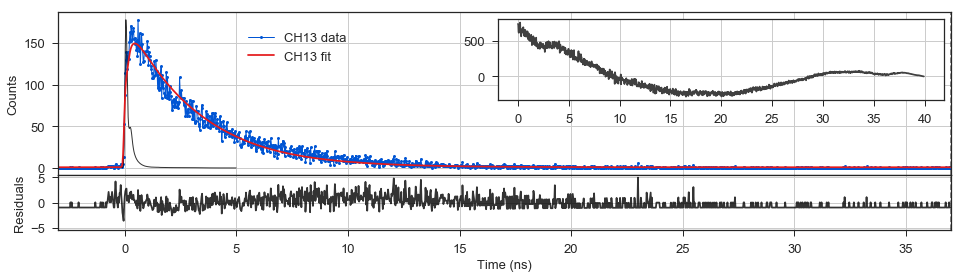

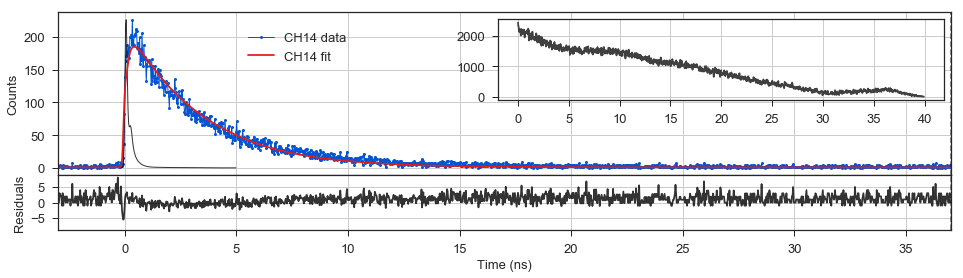

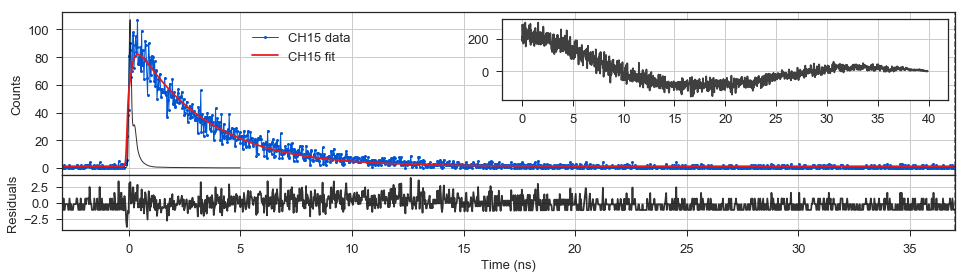

In [149]:
t1, t2 = -3, 37
dx = d
weight = False
model = model_1exp_conv
channels = range(16)

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)

params0 = lmfit.Parameters()
params0.add('tau', min=1, max=9, value=3.6)
params0.add('ampl', min=0, value=20)
params0.add('baseline', min=0, value=1)
params0.add('offset', value=2)

rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 5      # ns, end time of the IRF from t @ 0.5 of peak value
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich],
                     t_start=t1, t_stop=t2, pdf=False)
    x_model, lifet_hist_sel = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
                                            
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'y': lifet_hist_sel, 'x': x_model, 'model_func': model, 'weight': weight, 'irf': irf_pdf}
    res = lmfit.minimize(residuals_func, params0, kws=fitfunc_kws, method='nelder')
    res_bulk[ich] = res
    
    y_model = model(x_model,  irf=irf_pdf, **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws) 
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist_sel.max(), color='k', alpha=0.8, lw=1)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(t1, t2)
    ax[0].legend(loc='upper left', bbox_to_anchor=(0.2, 0.95))
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
        a.axvline(t2, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [150]:
popcfitg = br.glance(res_bulk, var_names='spot')
popcfit = br.tidy(res_bulk, var_names='spot')

(2.5, 4)

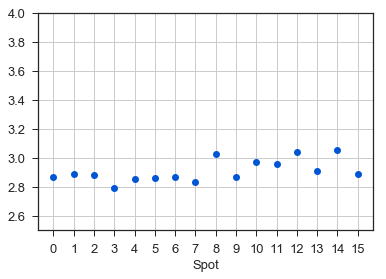

In [151]:
linplot16(np.array(popcfit.loc[popcfit.name == 'tau', 'value']))
plt.ylim(2.5, 4)

(1, 3)

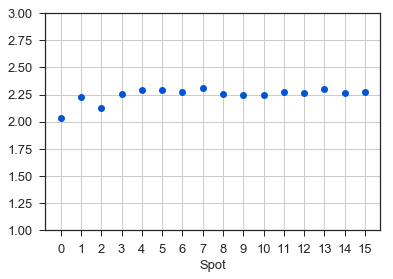

In [152]:
linplot16(np.array(popcfit.loc[popcfit.name == 'offset', 'value']))
plt.ylim(1, 3)

#### 2-exponential

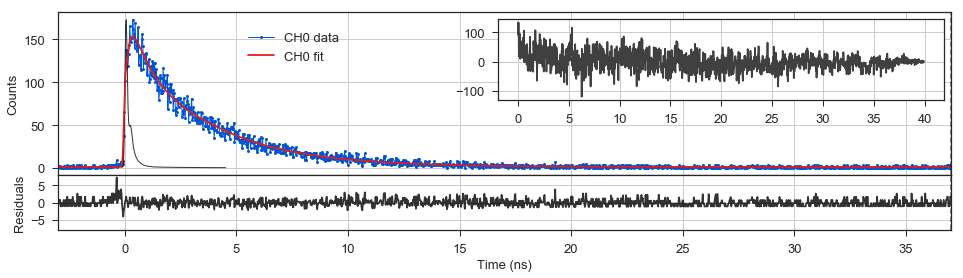

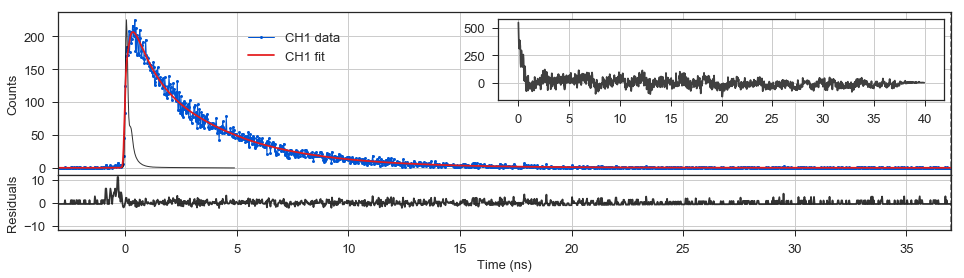

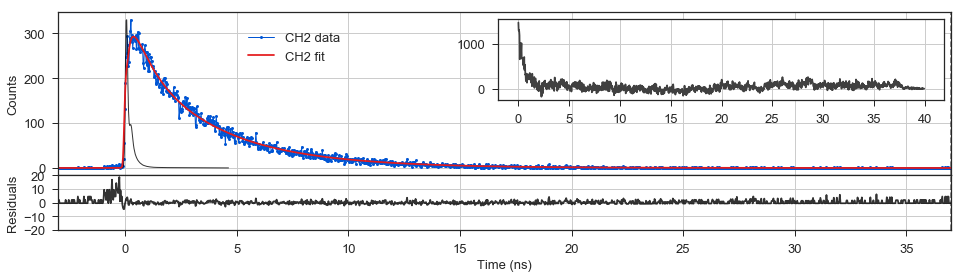

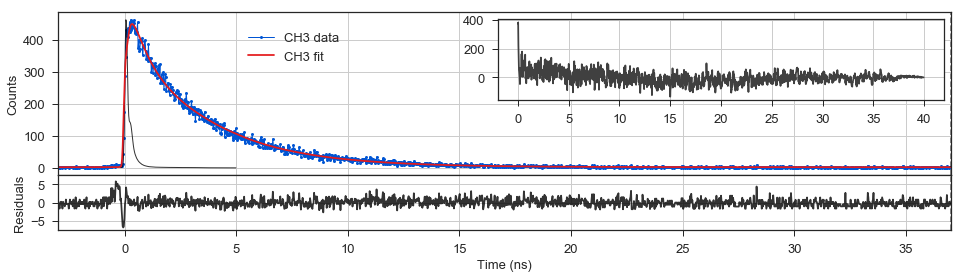

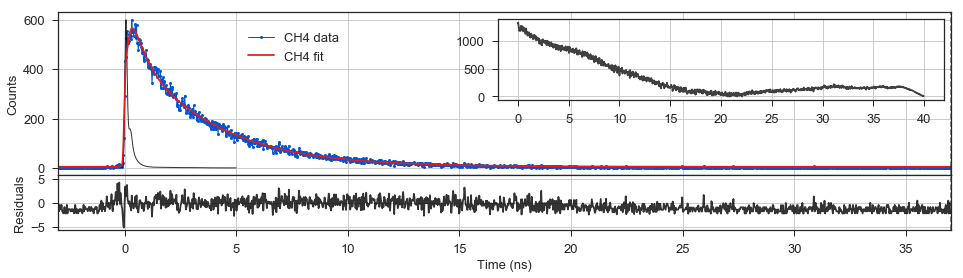

...

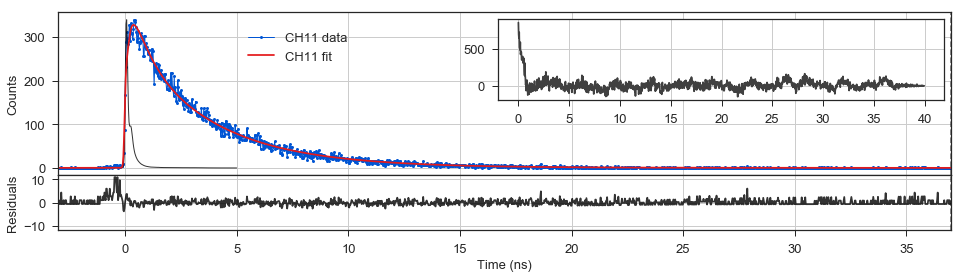

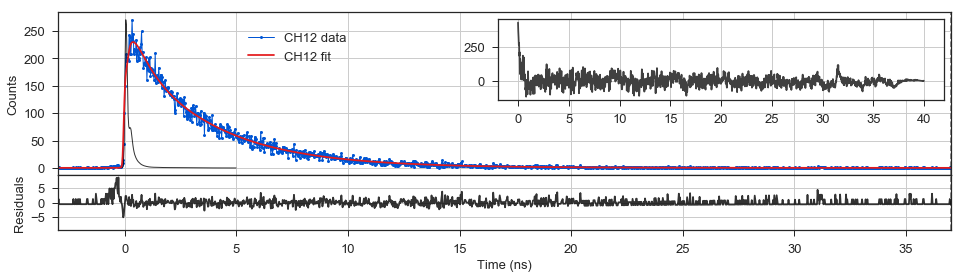

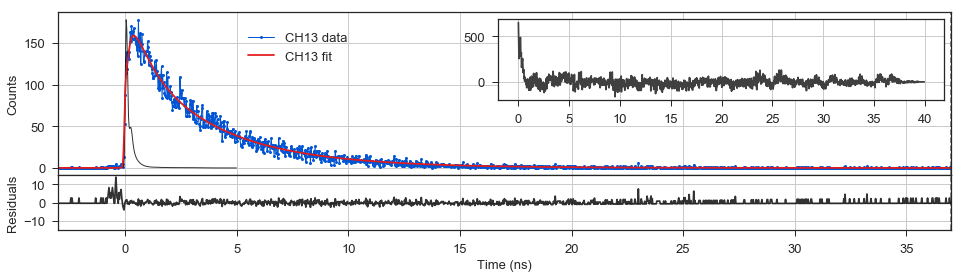

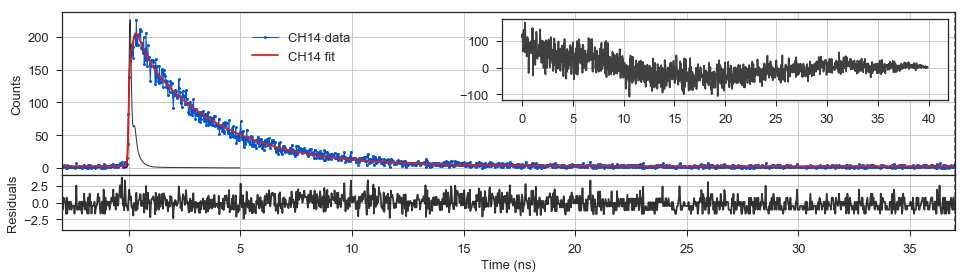

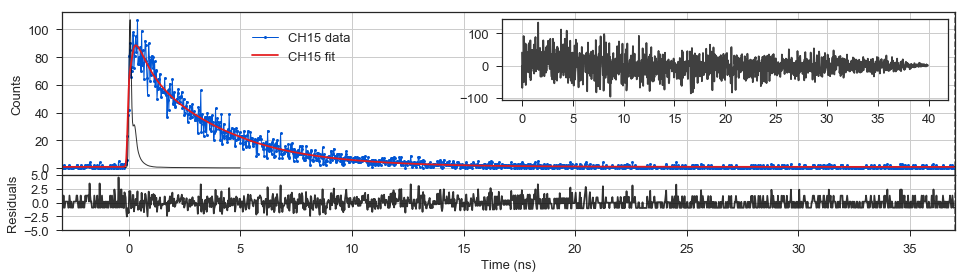

In [153]:
t1, t2 = -3, 37
dx = d
weight = False
model = model_2exp_conv
channels = range(16)

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)

params0 = lmfit.Parameters()
params0.add('tau1', min=0.2, max=2, value=0.8)
params0.add('ampl1', min=0, value=1)
params0.add('tau2', min=2, max=9, value=3.6)
params0.add('ampl2', min=0, value=2)
params0.add('baseline', min=0, value=1)
params0.add('offset', value=2)

rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 5      # ns, end time of the IRF from t @ 0.5 of peak value
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich],
                     t_start=t1, t_stop=t2, pdf=False)
    x_model, lifet_hist_sel = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
                                            
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'y': lifet_hist_sel, 'x': x_model, 'model_func': model, 'weight': weight, 'irf': irf_pdf}
    res = lmfit.minimize(residuals_func, params0, kws=fitfunc_kws, method='nelder')
    #res = lmfit.minimize(residuals_func, res.params, kws=fitfunc_kws, method='leastsq')
    res_bulk[ich] = res
    
    y_model = model(x_model,  irf=irf_pdf, **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws)
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist_sel.max(), color='k', alpha=0.8, lw=1)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(t1, t2)
    ax[0].legend(loc='upper left', bbox_to_anchor=(0.2, 0.95))
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
        a.axvline(t2, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [154]:
res.params.valuesdict()

OrderedDict([('tau1', 0.45983927128619295),
             ('ampl1', 1.1457467817432514),
             ('tau2', 3.4146784236803027),
             ('ampl2', 2.2809042080988498),
             ('baseline', 0.8308647308450634),
             ('offset', 2.2941096729157975)])

In [155]:
popcfitg2 = br.glance(res_bulk, var_names='spot')
popcfit2 = br.tidy(res_bulk, var_names='spot')

In [156]:
popcfit2.head()

,name,value,min,max,vary,expr,stderr,init_value,spot
0,ampl1,2.283761,0.000000,inf,True,NaN,NaN,1.732051,0
1,ampl2,3.568054,0.000000,inf,True,NaN,NaN,2.828427,0
2,baseline,1.143988,0.000000,inf,True,NaN,NaN,1.732051,0
3,offset,2.089904,-inf,inf,True,NaN,NaN,2.000000,0
4,tau1,0.738747,0.200000,2.000000,True,NaN,NaN,-0.339837,0


(0, 5)

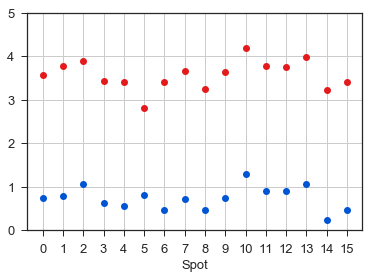

In [157]:
kws = dict(marker='o', lw=0, elinewidth=3, ms=7)
for par in ('tau1', 'tau2'):
    df = popcfit2.loc[popcfit2.name == par, ('value', 'stderr')]
    linplot16(df.value, yerr=3*df.stderr, kind='errorbar', ax=plt.gca(), **kws)
plt.ylim(0, 5)

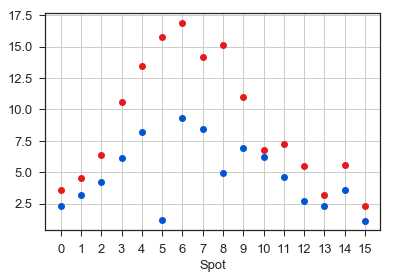

In [158]:
kws = dict(marker='o', lw=0, elinewidth=3, ms=7)
for par in ('ampl1', 'ampl2'):
    df = popcfit2.loc[popcfit2.name == par, ('value', 'stderr')]
    linplot16(df.value, yerr=3*df.stderr, kind='errorbar', ax=plt.gca(), **kws)

(1, 3)

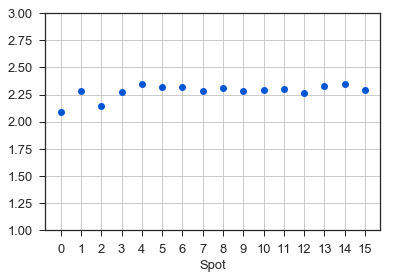

In [159]:
linplot16(np.array(popcfit2.loc[popcfit2.name == 'offset', 'value']))
plt.ylim(1, 3)

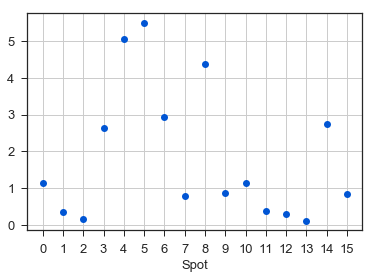

In [160]:
linplot16(np.array(popcfit2.loc[popcfit2.name == 'baseline', 'value']))

#### 3-exponential

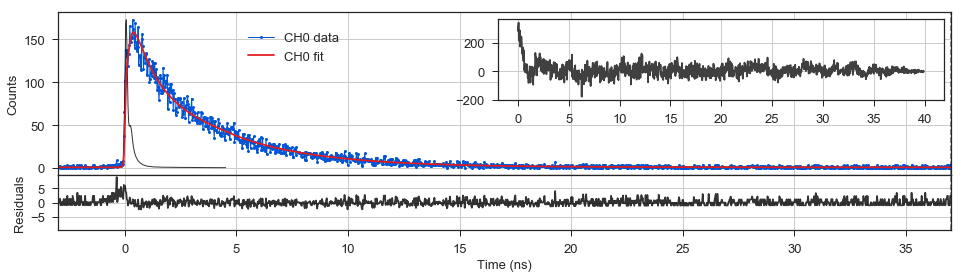

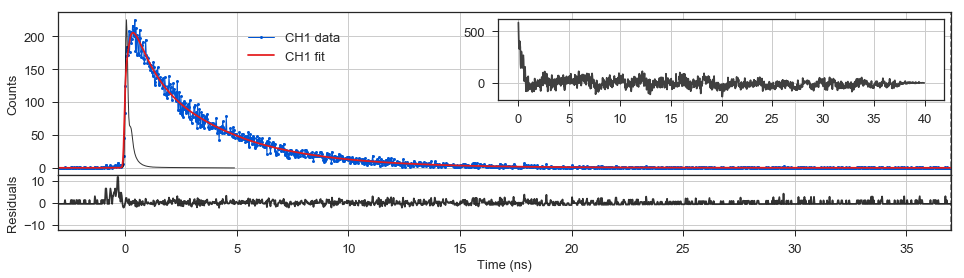

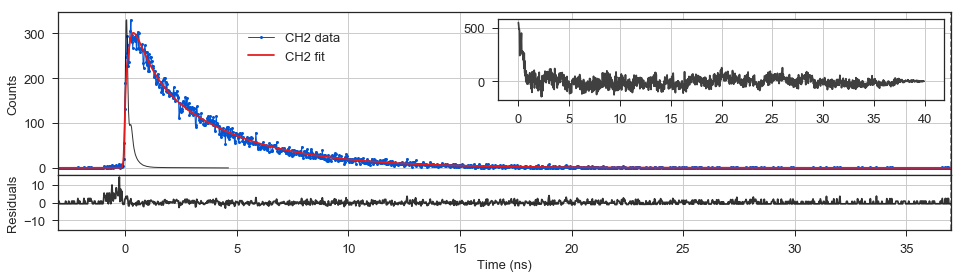

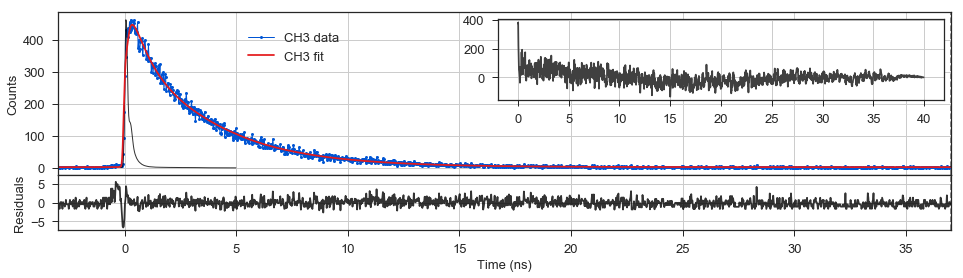

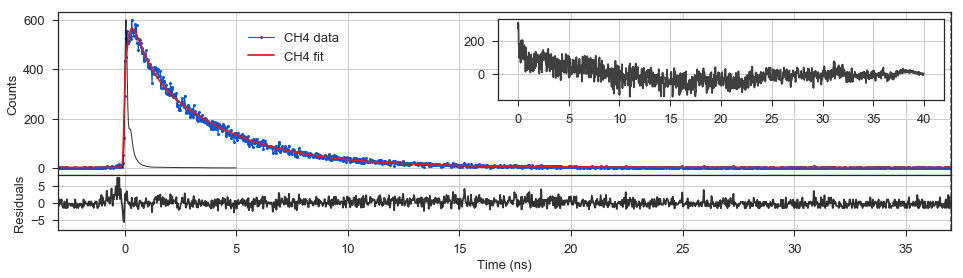

...

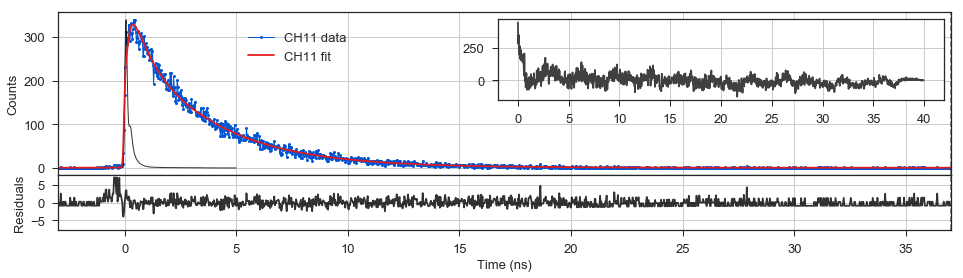

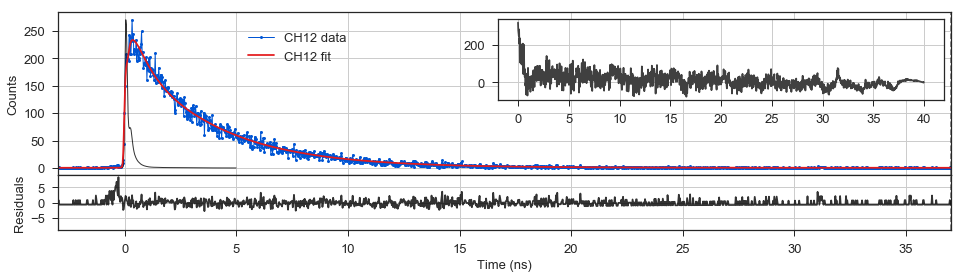

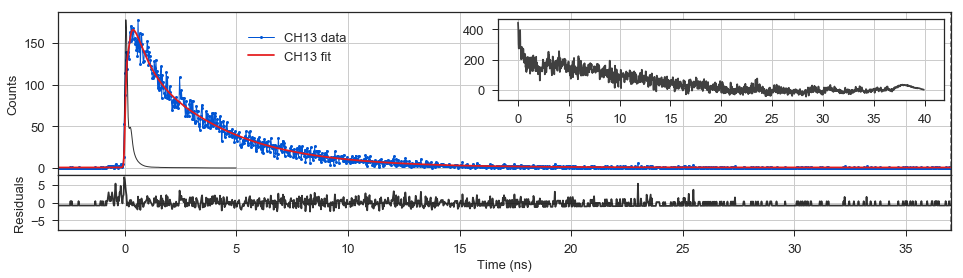

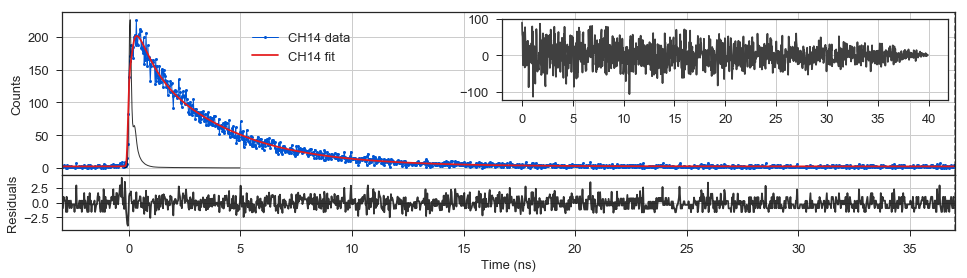

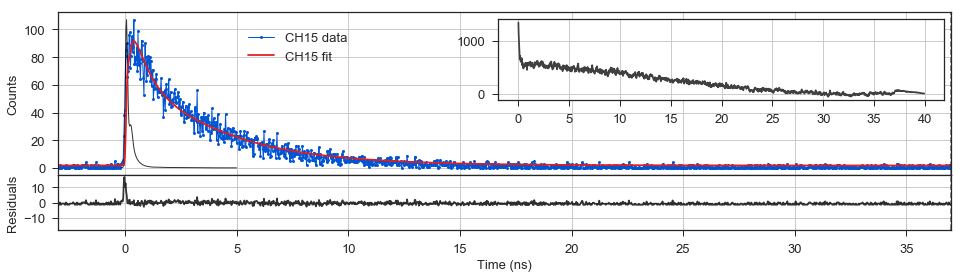

In [161]:
t1, t2 = -3, 37
dx = d
weight = False
model = model_3exp_conv
channels = range(16)

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)

params0 = lmfit.Parameters()
params0.add('tau1', min=0.0, max=0.05, value=0.001)
params0.add('ampl1', min=0, max=2, value=0.5)
params0.add('tau2', min=0.4, max=1.5, value=0.8)
params0.add('ampl2', min=0, value=5)
params0.add('tau3', min=1, max=9, value=3.6)
params0.add('ampl3', min=0, value=5)
params0.add('baseline', min=0, value=1)
params0.add('offset', value=3)

rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 5      # ns, end time of the IRF from t @ 0.5 of peak value
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich],
                     t_start=t1, t_stop=t2, pdf=False)
    x_model, lifet_hist_sel = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
                                            
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'y': lifet_hist_sel, 'x': x_model, 'model_func': model, 'weight': weight, 'irf': irf_pdf}
    res = lmfit.minimize(residuals_func, params0, kws=fitfunc_kws, method='nelder')
    #res = lmfit.minimize(residuals_func, res.params, kws=fitfunc_kws, method='leastsq')
    res_bulk[ich] = res
    
    y_model = model(x_model,  irf=irf_pdf, **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws)
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist_sel.max(), color='k', alpha=0.8, lw=1)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(t1, t2)
    ax[0].legend(loc='upper left', bbox_to_anchor=(0.2, 0.95))
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
        a.axvline(t2, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [162]:
popcfitg3 = br.glance(res_bulk, var_names='spot')
popcfit3 = br.tidy(res_bulk, var_names='spot')

In [163]:
popcfit3.loc[popcfit3.name == 'tau1'].head()

,name,value,min,max,vary,expr,stderr,init_value,spot
5,tau1,0.001951,0.0,0.05,True,NaN,NaN,-1.287002,0
13,tau1,0.001797,0.0,0.05,True,NaN,NaN,-1.287002,1
21,tau1,0.012132,0.0,0.05,True,NaN,NaN,-1.287002,2
29,tau1,0.007627,0.0,0.05,True,NaN,NaN,-1.287002,3
37,tau1,0.049490,0.0,0.05,True,NaN,NaN,-1.287002,4


(0, 5)

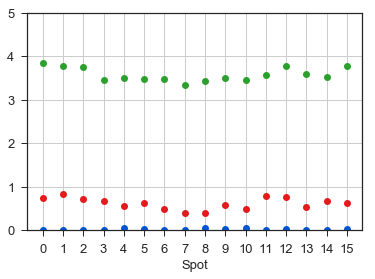

In [164]:
kws = dict(marker='o', lw=0, elinewidth=3, ms=7)
for par in ('tau1', 'tau2', 'tau3'):
    df = popcfit3.loc[popcfit3.name == par, ('value', 'stderr')]
    linplot16(df.value, yerr=3*df.stderr, kind='errorbar', ax=plt.gca(), **kws)
plt.ylim(0, 5)

In [165]:
basepar = ('ampl', 'tau')
parnames = ['%s%d' % (x, i) for i in (1, 2, 3) for x in basepar] + ['offset', 'baseline']
df = pd.DataFrame(dict(**{par: np.array(popcfit3.loc[popcfit3.name == par, 'value']) for par in parnames},
                       **{par+'_std': np.array(popcfit3.loc[popcfit3.name == par, 'stderr']) for par in parnames}))
df.head()

,ampl1,ampl1_std,ampl2,ampl2_std,ampl3,ampl3_std,baseline,baseline_std,offset,offset_std,tau1,tau1_std,tau2,tau2_std,tau3,tau3_std
0,0.129034,NaN,2.980366,NaN,3.194486,NaN,0.837097,NaN,2.143216,NaN,0.001951,NaN,0.756007,NaN,3.855628,NaN
1,0.670451,NaN,3.118512,NaN,4.483042,NaN,0.327105,NaN,2.282759,NaN,0.001797,NaN,0.840031,NaN,3.787178,NaN
2,0.354732,NaN,4.483853,NaN,6.906168,NaN,0.429832,NaN,2.169420,NaN,0.012132,NaN,0.713794,NaN,3.753612,NaN
3,0.557230,NaN,5.820724,NaN,10.435637,NaN,2.762104,NaN,2.282862,NaN,0.007627,NaN,0.684460,NaN,3.448641,NaN
4,1.876674,NaN,8.329841,NaN,13.343716,NaN,2.476945,NaN,2.344635,NaN,0.049490,NaN,0.569863,NaN,3.512109,NaN


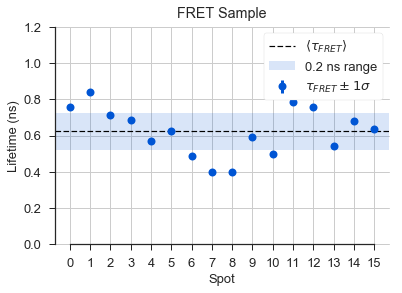

In [166]:
linplot16(df.tau2, kind='errorbar', yerr=df.tau2_std, marker='o', ms=8, lw=0, elinewidth=3,
          title='FRET Sample', label=r'$\tau_{FRET} \pm 1\sigma$')
plt.ylim(0, 1.2001)
plt.axhline(df.tau2.mean(), ls='--', color='k', lw=1.2, label=r'$\langle\tau_{FRET}\rangle$')
plt.axhspan(df.tau2.mean() - 0.1, df.tau2.mean() + 0.1, alpha=0.15, label='0.2 ns range')
plt.ylabel('Lifetime (ns)')
leg = plt.legend(frameon=True)#, loc='lower right')#, loc='center left', bbox_to_anchor=(1, 0.5))
leg.get_frame().set(alpha=1)
sns.despine(trim=True, offset=0)

(0, 5)

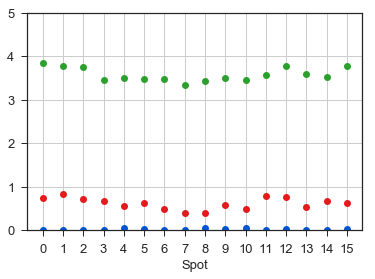

In [167]:
kws = dict(marker='o', lw=0, elinewidth=3, ms=7)
for par in ('tau1', 'tau2', 'tau3'):
    df = popcfit3.loc[popcfit3.name == par, ('value', 'stderr')]
    linplot16(df.value, yerr=3*df.stderr, kind='errorbar', ax=plt.gca(), **kws)
plt.ylim(0, 5)

In [168]:
popcfit3.loc[popcfit3.name == 'tau1', 'value'].describe()

count    1.600000e+01
mean     2.196544e-02
std      1.904763e-02
min      9.607545e-07
25%      5.052911e-03
50%      1.544553e-02
75%      4.035463e-02
max      4.948951e-02
Name: value, dtype: float64

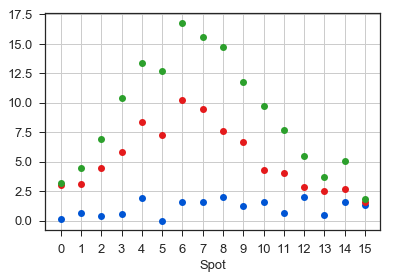

In [169]:
kws = dict(marker='o', lw=0, elinewidth=3, ms=7)
for par in ('ampl1', 'ampl2', 'ampl3'):
    df = popcfit3.loc[popcfit3.name == par, ('value', 'stderr')]
    linplot16(df.value, yerr=3*df.stderr, kind='errorbar', ax=plt.gca(), **kws)

(1, 3)

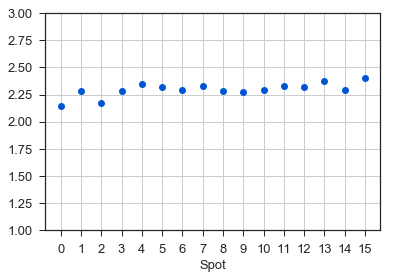

In [170]:
linplot16(np.array(popcfit3.loc[popcfit3.name == 'offset', 'value']))
plt.ylim(1, 3)

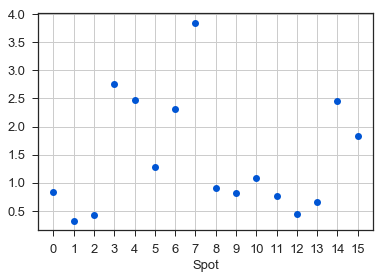

In [171]:
linplot16(np.array(popcfit3.loc[popcfit3.name == 'baseline', 'value']))